In [1]:
import os
import xarray as xr
import numpy as np
import gdal

# Load data from .nc files
precip_data = xr.open_dataset('E:\\SSG_DOCUMENTS\\CNN_LSTM\\Subset_Precipitation\\m_ppt.nc', decode_times=False)['ppt'].values

# Define the number of years and bands per year
num_years = 31  # Number of years from 1993 to 2023
bands_per_year = 12  # Number of bands per year

# Get the directory of the input files
input_dir = os.path.dirname(os.path.abspath('E:\\SSG_DOCUMENTS\\CNN_LSTM\\Subset_Precipitation\\m_ppt.nc'))

# Iterate over each year
for year in range(1993, 2024):
    # Calculate the start and end indices for the current year
    start_band = (year - 1993) * bands_per_year
    end_band = start_band + bands_per_year
    
    # Iterate over each band in the current year
    for band in range(start_band, end_band):
        # Extract the data for the current band
        band_data = precip_data[band]  # Assuming all arrays have the same shape
        
        # Define the file name for the current band
        file_name = os.path.join(input_dir, f'{year}_{band+1}.tiff')
        
        # Write the data to a TIFF file
        driver = gdal.GetDriverByName('GTiff')
        outRaster = driver.Create(file_name, band_data.shape[1], band_data.shape[0], 1, gdal.GDT_Float32)
        outRaster.GetRasterBand(1).WriteArray(band_data)
        outRaster = None  # Close the file
        
        print(f"Saved band {band+1} of {year} to {file_name}")


ModuleNotFoundError: No module named 'gdal'

In [2]:
%pip install gdal



  Using cached GDAL-3.8.5.tar.gz (802 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for gdal
Failed to build gdal
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [117 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      creating build\lib.win-amd64-cpython-310
      creating build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\gdal.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\gdalconst.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\gdalnumeric.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\gdal_array.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\gnm.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\ogr.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\osr.py -> build\lib.win-amd64-cpython-310\osgeo
      copying osgeo\__init__.py -> build\lib.win-amd64-cpython-310\osgeo
      creating build\lib.win-amd64-cpython-310\osgeo_utils
      copying gdal-utils\osgeo_utils

In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [3.79, 4.97, 10.97, 11.59, 15.53, 12.44],
    'S2': [4.87, 6.79, 8.88, 9.72, 13.73, 5.76],
    'S3': [2.81, 8.60, 7.14, 7.04, 7.95, 6.61],
    'S4': [3.01, 9.48, 7.70, 6.42, 7.12, 6.43],
    'S5': [4.25, 8.33, 6.94, 8.09, 8.30, 5.66],
    'S6': [3.92, 6.29, 6.24, 6.18, 6.01, 5.34],
    'S7': [3.57, 4.83, 4.69, 5.50, 5.23, 4.45],
    'S8': [2.61, 5.71, 4.69, 4.99, 5.88, 3.32],
    'S9': [1.62, 1.89, 3.49, 3.01, 3.18, 1.89],
    'S10': [1.57, 2.42, 2.54, 1.82, 2.90, 2.85],
    'S11': [0.80, 2.04, 2.11, 1.45, 2.43, 1.92]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Train models and predict for each segment
predictions_2030 = []
predictions_2050 = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100)),
        ('gb', GradientBoostingRegressor(n_estimators=100))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted BI* for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted BI* for {segment} in 2050: {predictions_2050[i]}")


Predicted BI* for S1 in 2030: 17.118204220654945
Predicted BI* for S1 in 2050: 21.320905045156167
Predicted BI* for S2 in 2030: 11.186695256486388
Predicted BI* for S2 in 2050: 12.809349688764343
Predicted BI* for S3 in 2030: 8.327221366415728
Predicted BI* for S3 in 2050: 9.246316115478692
Predicted BI* for S4 in 2030: 7.462764298232493
Predicted BI* for S4 in 2050: 7.875007389285976
Predicted BI* for S5 in 2030: 7.777473600613767
Predicted BI* for S5 in 2050: 8.254598197789882
Predicted BI* for S6 in 2030: 6.266179870034009
Predicted BI* for S6 in 2050: 6.59912709735503
Predicted BI* for S7 in 2030: 5.369789276187554
Predicted BI* for S7 in 2050: 5.7422371165486865
Predicted BI* for S8 in 2030: 5.0393791840936295
Predicted BI* for S8 in 2050: 5.298884749607453
Predicted BI* for S9 in 2030: 3.07002667896365
Predicted BI* for S9 in 2050: 3.381375257419066
Predicted BI* for S10 in 2030: 3.0214730158320577
Predicted BI* for S10 in 2050: 3.404524262974185
Predicted BI* for S11 in 2030: 2.

In [3]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [3.79, 4.97, 10.97, 11.59, 15.53, 12.44],
    'S2': [4.87, 6.79, 8.88, 9.72, 13.73, 5.76],
    'S3': [2.81, 8.60, 7.14, 7.04, 7.95, 6.61],
    'S4': [3.01, 9.48, 7.70, 6.42, 7.12, 6.43],
    'S5': [4.25, 8.33, 6.94, 8.09, 8.30, 5.66],
    'S6': [3.92, 6.29, 6.24, 6.18, 6.01, 5.34],
    'S7': [3.57, 4.83, 4.69, 5.50, 5.23, 4.45],
    'S8': [2.61, 5.71, 4.69, 4.99, 5.88, 3.32],
    'S9': [1.62, 1.89, 3.49, 3.01, 3.18, 1.89],
    'S10': [1.57, 2.42, 2.54, 1.82, 2.90, 2.85],
    'S11': [0.80, 2.04, 2.11, 1.45, 2.43, 1.92]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100)),
        ('gb', GradientBoostingRegressor(n_estimators=100))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted BI* for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted BI* for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted BI* for S1 in 2030: 17.261177553988205
Predicted BI* for S1 in 2050: 21.500882188013236
R² score for S1: 0.9527730017329533
MAE for S1: 0.8091796853507204

Predicted BI* for S2 in 2030: 11.03985525648639
Predicted BI* for S2 in 2050: 12.579963022097672
R² score for S2: 0.8119219025925833
MAE for S2: 0.9762331128031884

Predicted BI* for S3 in 2030: 8.309025810860177
Predicted BI* for S3 in 2050: 9.22520246468504
R² score for S3: 0.7698421139686166
MAE for S3: 0.6563003917514291

Predicted BI* for S4 in 2030: 7.431873187121383
Predicted BI* for S4 in 2050: 7.826080087698678
R² score for S4: 0.699322193118662
MAE for S4: 0.7732004713175558

Predicted BI* for S5 in 2030: 7.731929156169322
Predicted BI* for S5 in 2050: 8.150406134297818
R² score for S5: 0.7524380642627734
MAE for S5: 0.6609280933349443

Predicted BI* for S6 in 2030: 6.2808043144784484
Predicted BI* for S6 in 2050: 6.623197256085181
R² score for S6: 0.783645310584185
MAE for S6: 0.32225273734948684

Predicted BI* 

In [4]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [0.59, 0.97, 4.81, 4.34, 6.61, 4.41],
    'S2': [1.31, 2.15, 3.66, 3.20, 5.45, 1.95],
    'S3': [0.09, 2.32, 1.86, 2.41, 2.06, 1.29],
    'S4': [0.39, 2.26, 2.08, 1.27, 1.87, 1.28],
    'S5': [0.49, 2.24, 1.95, 2.74, 1.84, 1.16],
    'S6': [0.69, 1.28, 1.40, 1.73, 1.02, 1.35],
    'S7': [0.59, 0.88, 0.50, 1.30, 0.70, 1.00],
    'S8': [0.29, 1.15, 0.69, 1.08, 1.64, 0.49],
    'S9': [0.10, 0.10, 0.29, 0.10, 0.40, 0.10],
    'S10': [0.10, 0.10, 0.10, 0.10, 0.31, 0.31],
    'S11': [0.11, 0.11, 0.12, 0.21, 0.32, 0.10]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100)),
        ('gb', GradientBoostingRegressor(n_estimators=100))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted BI* for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted BI* for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted BI* for S1 in 2030: 7.060972969186764
Predicted BI* for S1 in 2050: 9.019532126182355
R² score for S1: 0.9164459336476231
MAE for S1: 0.5536570354513044

Predicted BI* for S2 in 2030: 4.208819330288179
Predicted BI* for S2 in 2050: 4.925576407913155
R² score for S2: 0.7851302584020888
MAE for S2: 0.48991611794260564

Predicted BI* for S3 in 2030: 2.2565132446200273
Predicted BI* for S3 in 2050: 2.5779747812282956
R² score for S3: 0.7864344761615236
MAE for S3: 0.30078496095758905

Predicted BI* for S4 in 2030: 1.7309649339383686
Predicted BI* for S4 in 2050: 1.842786166030134
R² score for S4: 0.732806849435778
MAE for S4: 0.28545664604755755

Predicted BI* for S5 in 2030: 2.0640160904839036
Predicted BI* for S5 in 2050: 2.237371316792167
R² score for S5: 0.7678544077019599
MAE for S5: 0.2981259796992528

Predicted BI* for S6 in 2030: 1.5146969179729197
Predicted BI* for S6 in 2050: 1.6680570615764942
R² score for S6: 0.8157291606402706
MAE for S6: 0.12085675400967809

Predict

In [5]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [1.32, 1.86, 3.73, 3.51, 4.38, 3.99],
    'S2': [1.82, 2.57, 3.09, 3.04, 3.91, 2.12],
    'S3': [1.08, 2.24, 2.07, 2.62, 2.26, 1.72],
    'S4': [1.30, 2.82, 2.42, 2.10, 2.37, 1.83],
    'S5': [1.61, 2.46, 2.43, 2.76, 2.55, 1.86],
    'S6': [1.63, 1.77, 2.03, 2.21, 1.73, 1.67],
    'S7': [1.54, 1.45, 1.39, 2.00, 1.58, 1.55],
    'S8': [1.25, 1.68, 1.41, 1.70, 1.98, 1.31],
    'S9': [0.00, 0.00, 1.09, 0.00, 1.06, 0.00],
    'S10': [0.00, 0.00, 0.00, 0.00, 1.07, 1.11],
    'S11': [0.00, 0.00, 0.00, 1.05, 1.08, 0.00]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100)),
        ('gb', GradientBoostingRegressor(n_estimators=100))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted Pt for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted Pt for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted Pt for S1 in 2030: 5.134652792599681
Predicted Pt for S1 in 2050: 6.293924229640766
R² score for S1: 0.9449765448791084
MAE for S1: 0.2168914288415279

Predicted Pt for S2 in 2030: 3.327012017212617
Predicted Pt for S2 in 2050: 3.6430855508579185
R² score for S2: 0.79121911313317
MAE for S2: 0.25636864960803696

Predicted Pt for S3 in 2030: 2.399527215603495
Predicted Pt for S3 in 2050: 2.6205014975356526
R² score for S3: 0.8078910823869957
MAE for S3: 0.17718830064890692

Predicted Pt for S4 in 2030: 2.231365682761168
Predicted Pt for S4 in 2050: 2.270034961799296
R² score for S4: 0.7327844984564671
MAE for S4: 0.19839324058700045

Predicted Pt for S5 in 2030: 2.470442783862074
Predicted Pt for S5 in 2050: 2.576911676227704
R² score for S5: 0.7975186402325884
MAE for S5: 0.16373536267910935

Predicted Pt for S6 in 2030: 1.875608658690098
Predicted Pt for S6 in 2050: 1.893791384290789
R² score for S6: 0.8126528497557459
MAE for S6: 0.08125720826481926

Predicted Pt for S7 in 

In [14]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error
import random

# Set a random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [75.51287527, 95.81248925, 47.38574243, 52.72151777, 29.73763313, 43.07299975],
    'S2': [44.47951104, 80.11083795, 58.32907001, 45.77156181, 42.668852, 89.00632536],
    'S3': [59.10867146, 79.37818349, 53.81454376, 64.90939889, 50.65588123, 64.48013742],
    'S4': [64.26168261, 58.31861041, 55.85961207, 63.96678291, 50.86310455, 79.38797113],
    'S5': [58.28960796, 52.42864982, 49.60978607, 52.7182556, 67.04467691, 81.35719461],
    'S6': [55.32193378, 68.67120187, 63.28740034, 58.96093193, 86.60713412, 61.08082594],
    'S7': [70.21779448, 61.87869769, 60.85344069, 55.83669023, 77.8416755, 95.56418412],
    'S8': [90.6958751, 83.05443638, 78.03339481, 90.38815879, 91.94566635, 99.57110765],
    'S9': [94.8235254, 96.95281546, 91.75203202, 94.77113237, 98.67119048, 93.63145794],
    'S10': [88.27306861, 92.25675174, 86.65426984, 91.75742726, 93.35991038, 90.17382612],
    'S11': [99.00377169, 99.12772797, 71.91943884, 97.6484465, 99.70940481, 92.67916881]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingRegressor(n_estimators=100, random_state=42))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted value for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted value for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted value for S1 in 2030: 22.270765989057963
Predicted value for S1 in 2050: 1.8949884616245072
R² score for S1: 0.9008886328524932
MAE for S1: 6.003723980226638

Predicted value for S2 in 2030: 67.04990747737816
Predicted value for S2 in 2050: 71.11118337994668
R² score for S2: 0.7789731350804762
MAE for S2: 7.825081041052967

Predicted value for S3 in 2030: 56.627452462108806
Predicted value for S3 in 2050: 53.46051183467256
R² score for S3: 0.7365761427509436
MAE for S3: 4.492590370899442

Predicted value for S4 in 2030: 66.91399983054441
Predicted value for S4 in 2050: 69.88472412460158
R² score for S4: 0.7790937146041959
MAE for S4: 3.487668642647337

Predicted value for S5 in 2030: 75.12844944828896
Predicted value for S5 in 2050: 83.8461030068637
R² score for S5: 0.9110805617869437
MAE for S5: 2.856424879833656

Predicted value for S6 in 2030: 73.94009311565429
Predicted value for S6 in 2050: 78.52306742904085
R² score for S6: 0.7722534889961108
MAE for S6: 4.2363674398974

In [17]:
import pandas as pd
import numpy as np
from scipy import stats
import os

# Set the save location
save_location = r"D:\Sekh Mohinuddin\Test"

# Input data manually (only Day_1 and Cos_1)
data = {
    'Day_1': [0.171783, 0.343635, 0.329857, 0.29966, 0.409447, 0.334557, 0.252373, 0.357841, 0.334602, 0.324333, 
              0.280556, 0.11285, 0.134491, 0.395164, 0.324852, 0.694908, 0.300362, 0.712303, 0.355095, 0.32708, 
              0.284386, 0.172142, 0.274895, 0.433174, 0.326347, 0.341972, 0.445457, 0.27317, 0.32383, 0.332451, 
              0.302132, 0.302498, 0.220528, 0.298622, 0.260986, 0.338905, 0.258583, 0.432381, 0.303932, 0.342491, 
              0.385811, 0.458687, 0.413505, 0.425209],
    'Cos_1': [36.7, 38.0, 36.7, 21.2, 25.8, 51.1, 42.9, 52.9, 53.4, 39.9, 41.2, 36.1, 14.3, 25.3, 56.8, 68.3, 
              54.0, 63.0, 42.6, 72.1, 48.3, 46.8, 28.1, 53.1, 33.7, 56.5, 55.4, 39.3, 69.5, 43.9, 23.5, 50.2, 
              50.2, 37.2, 32.6, 34.0, 32.2, 37.1, 61.2, 32.3, 36.9, 51.7, 37.4, 75.3]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Convert to 0-1 scale
df_scaled = (df - df.min()) / (df.max() - df.min())

# Calculate Pearson correlation
correlation, p_value = stats.pearsonr(df_scaled['Day_1'], df_scaled['Cos_1'])

# Create a new DataFrame with the results
results_df = pd.DataFrame({
    'Metric': ['Pearson Correlation', 'P-value'],
    'Value': [correlation, p_value]
})

# Create the full file path
file_path = os.path.join(save_location, 'correlation_results.xlsx')

# Create an Excel writer object
with pd.ExcelWriter(file_path) as writer:
    # Write the scaled data to the first sheet
    df_scaled.to_excel(writer, sheet_name='Scaled Data', index=False)
    
    # Write the correlation results to the second sheet
    results_df.to_excel(writer, sheet_name='Correlation Results', index=False)

print(f"Data and results have been saved to '{file_path}'")

Data and results have been saved to 'D:\Sekh Mohinuddin\Test\correlation_results.xlsx'


In [19]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error

# Set a random seed for reproducibility
random_seed = 42

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [24.48712473, 4.187510751, 52.61425757, 47.27848223, 70.26236687, 56.92700025],
    'S2': [55.52048896, 19.88916205, 41.67092999, 54.22843819, 57.331148, 10.99367464],
    'S3': [40.89132854, 20.62181651, 46.18545624, 35.09060111, 49.34411877, 35.51986258],
    'S4': [35.73831739, 41.68138959, 44.14038793, 36.03321709, 49.13689545, 20.61202887],
    'S5': [41.71039204, 47.57135018, 50.39021393, 47.2817444, 32.95532309, 18.64280539],
    'S6': [44.67806622, 31.32879813, 36.71259966, 41.03906807, 13.39286588, 38.91917406],
    'S7': [29.78220552, 38.12130231, 39.14655931, 44.16330977, 22.1583245, 4.435815882],
    'S8': [9.304124896, 16.94556362, 21.96660519, 9.611841207, 8.054333653, 0.42889235],
    'S9': [5.176474603, 3.047184538, 8.247967983, 5.228867629, 1.328809519, 6.368542058],
    'S10': [11.72693139, 7.743248257, 13.34573016, 8.242572743, 6.640089623, 9.826173879],
    'S11': [0.996228312, 0.872272033, 28.08056116, 2.351553502, 0.290595191, 7.320831193]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=random_seed)),
        ('gb', GradientBoostingRegressor(n_estimators=100, random_state=random_seed))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted value for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted value for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted value for S1 in 2030: 77.72923401080561
Predicted value for S1 in 2050: 98.10501153805808
R² score for S1: 0.9008886328540925
MAE for S1: 6.003723980110671

Predicted value for S2 in 2030: 32.950092522621844
Predicted value for S2 in 2050: 28.88881662005332
R² score for S2: 0.7789731350804759
MAE for S2: 7.825081041052972

Predicted value for S3 in 2030: 43.372547537891194
Predicted value for S3 in 2050: 46.53948816532744
R² score for S3: 0.7365761427509434
MAE for S3: 4.4925903708994435

Predicted value for S4 in 2030: 33.08600016945553
Predicted value for S4 in 2050: 30.115275875398368
R² score for S4: 0.7790937146041963
MAE for S4: 3.487668642647342

Predicted value for S5 in 2030: 24.87155055171104
Predicted value for S5 in 2050: 16.1538969931363
R² score for S5: 0.911080561786944
MAE for S5: 2.8564248798336496

Predicted value for S6 in 2030: 26.059906884345764
Predicted value for S6 in 2050: 21.476932570959207
R² score for S6: 0.7722534889961101
MAE for S6: 4.2363674398

In [20]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error

# Set a random seed for reproducibility
random_seed = 42

# Prepare the data
data = {
    'Year': [1970, 1980, 1990, 2000, 2010, 2020],
    'S1': [1.025911634, 1.004307218, 1.094801916, 1.09038148, 1.220138784, 1.112860528],
    'S2': [1.088428042, 1.020554852, 1.059909986, 1.108043478, 1.119663453, 1.009481171],
    'S3': [1.077235082, 1.033253556, 1.109517695, 1.068641731, 1.117307585, 1.071787878],
    'S4': [1.072850697, 1.088431096, 1.093449865, 1.071902531, 1.121172204, 1.031218449],
    'S5': [1.069106222, 1.100462531, 1.111519267, 1.096131163, 1.056356369, 1.026291559],
    'S6': [1.134262003, 1.074549312, 1.087320333, 1.094496911, 1.020901282, 1.074244219],
    'S7': [1.057933422, 1.08123553, 1.078824574, 1.092947613, 1.033974938, 1.005168626],
    'S8': [1.018698857, 1.040700312, 1.049975769, 1.019255633, 1.017242339, 1.000788671],
    'S9': [1.019212669, 1.011458145, 1.033085518, 1.020034104, 1.004864979, 1.024431056],
    'S10': [1.048795201, 1.029651654, 1.053953362, 1.030541288, 1.023882699, 1.036575917],
    'S11': [1.004339716, 1.004000648, 1.154282999, 1.011030492, 1.001333716, 1.036841284]
}

df = pd.DataFrame(data)

# Extract features and labels
X = df['Year'].values.reshape(-1, 1)

# Initialize lists to store results
predictions_2030 = []
predictions_2050 = []
r2_scores = []
mae_scores = []

for segment in df.columns[1:]:
    y = df[segment].values

    # Train models
    models = [
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=random_seed)),
        ('gb', GradientBoostingRegressor(n_estimators=100, random_state=random_seed))
    ]

    segment_predictions = np.zeros((len(models), len(df)))

    for i, (name, model) in enumerate(models):
        model.fit(X, y)
        segment_predictions[i] = model.predict(X)

    # Ensemble method: Average predictions
    ensemble_pred = segment_predictions.mean(axis=0)

    # Calculate R² and MAE for the ensemble model
    r2 = r2_score(y, ensemble_pred)
    mae = mean_absolute_error(y, ensemble_pred)
    r2_scores.append(r2)
    mae_scores.append(mae)

    # Predict for 2030 and 2050
    years = np.array([2030, 2050]).reshape(-1, 1)
    ensemble_model = LinearRegression()  # Using linear regression to fit the ensemble predictions
    ensemble_model.fit(X, ensemble_pred)

    segment_pred_2030_2050 = ensemble_model.predict(years)
    predictions_2030.append(segment_pred_2030_2050[0])
    predictions_2050.append(segment_pred_2030_2050[1])

# Display the predictions and metrics
for i, segment in enumerate(df.columns[1:]):
    print(f"Predicted value for {segment} in 2030: {predictions_2030[i]}")
    print(f"Predicted value for {segment} in 2050: {predictions_2050[i]}")
    print(f"R² score for {segment}: {r2_scores[i]}")
    print(f"MAE for {segment}: {mae_scores[i]}")
    print()


Predicted value for S1 in 2030: 1.199670703834225
Predicted value for S1 in 2050: 1.2619471777909252
R² score for S1: 0.894811500740553
MAE for S1: 0.019195123013326747

Predicted value for S2 in 2030: 1.0685104272123869
Predicted value for S2 in 2050: 1.0688992619689885
R² score for S2: 0.7742682190327037
MAE for S2: 0.01744398220921739

Predicted value for S3 in 2030: 1.0997220536962633
Predicted value for S3 in 2050: 1.1113075355007944
R² score for S3: 0.7481230871605744
MAE for S3: 0.013182682963007028

Predicted value for S4 in 2030: 1.0705954022795852
Predicted value for S4 in 2050: 1.0646666254063322
R² score for S4: 0.7606929327321695
MAE for S4: 0.01060967021454362

Predicted value for S5 in 2030: 1.043371151683793
Predicted value for S5 in 2050: 1.023796983615484
R² score for S5: 0.8810355695715358
MAE for S5: 0.009367252842549467

Predicted value for S6 in 2030: 1.0360106966568146
Predicted value for S6 in 2050: 1.010589628867058
R² score for S6: 0.8444668908083733
MAE for S

In [25]:
import pandas as pd
import numpy as np
from scipy import stats
import os

# Set the save location and input file path
save_location = r"D:\Sekh Mohinuddin\Test"
input_file = r"D:\Sekh Mohinuddin\Test\cos_smap_data1.csv"

# Read the CSV file
data = pd.read_csv(input_file)

# Function to calculate correlation and p-value
def calculate_correlation(col1, col2):
    col1_scaled = (col1 - col1.min()) / (col1.max() - col1.min())
    col2_scaled = (col2 - col2.min()) / (col2.max() - col2.min())
    correlation, p_value = stats.pearsonr(col1_scaled, col2_scaled)
    return correlation, p_value

# Calculate correlations for each Day column with each Cos column
correlations = []
p_values = []

for day in range(1, 32):
    day_correlations = []
    day_p_values = []
    for cos in range(1, 32):
        day_col = f'Day_{day}'
        cos_col = f'Cos_{cos}'
        if day_col in data.columns and cos_col in data.columns:
            correlation, p_value = calculate_correlation(data[day_col], data[cos_col])
            day_correlations.append(correlation)
            day_p_values.append(p_value)
        else:
            day_correlations.append(np.nan)
            day_p_values.append(np.nan)
    correlations.append(day_correlations)
    p_values.append(day_p_values)

# Create DataFrames for correlations and p-values
correlation_df = pd.DataFrame(correlations, 
                              index=[f'Day_{i}' for i in range(1, 32)],
                              columns=[f'Cos_{i}' for i in range(1, 32)])

p_value_df = pd.DataFrame(p_values, 
                          index=[f'Day_{i}' for i in range(1, 32)],
                          columns=[f'Cos_{i}' for i in range(1, 32)])

# Create the full file path for output
file_path = os.path.join(save_location, 'correlation_results_matrix.xlsx')

# Create an Excel writer object
with pd.ExcelWriter(file_path) as writer:
    # Write the original data to the first sheet
    data.to_excel(writer, sheet_name='Original Data', index=False)
    
    # Write the correlation matrix to the second sheet
    correlation_df.to_excel(writer, sheet_name='Correlation Matrix')
    
    # Write the p-value matrix to the third sheet
    p_value_df.to_excel(writer, sheet_name='P-value Matrix')

print(f"Data and results have been saved to '{file_path}'")

Data and results have been saved to 'D:\Sekh Mohinuddin\Test\correlation_results_matrix.xlsx'


In [36]:
import os
import numpy as np
import rasterio
from rasterio.enums import Resampling

def resample_to_match(source_path, reference_path, output_path):
    with rasterio.open(reference_path) as ref_ds:
        transform = ref_ds.transform
        crs = ref_ds.crs
        height = ref_ds.height
        width = ref_ds.width

    with rasterio.open(source_path) as src_ds:
        resampled_data = np.empty(shape=(src_ds.count, height, width), dtype=src_ds.dtypes[0])
        for band in range(1, src_ds.count + 1):
            resampled_data[band - 1] = src_ds.read(
                band,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )

        profile = src_ds.profile
        profile.update(
            transform=transform,
            crs=crs,
            width=width,
            height=height
        )

        with rasterio.open(output_path, 'w', **profile) as dst_ds:
            dst_ds.write(resampled_data)

def calculate_pixelwise_metrics(observed, predicted, nodata):
    mask = (observed != nodata) & (predicted != nodata)
    pbias = np.full_like(observed, nodata, dtype=np.float32)
    nse = np.full_like(observed, nodata, dtype=np.float32)
    nrmse = np.full_like(observed, nodata, dtype=np.float32)

    for i in range(observed.shape[1]):  # Iterate over the width
        for j in range(observed.shape[2]):  # Iterate over the height
            obs = observed[:, i, j][mask[:, i, j]]
            pred = predicted[:, i, j][mask[:, i, j]]

            if len(obs) > 0:
                pbias[:, i, j] = 100 * (np.sum(pred - obs) / np.sum(obs))
                if np.var(obs) > 0:  # Check for variance to avoid division by zero
                    nse[:, i, j] = 1 - (np.sum((pred - obs) ** 2) / np.sum((obs - np.mean(obs)) ** 2))
                if (np.max(obs) - np.min(obs)) > 0:  # Check for range to avoid division by zero
                    nrmse[:, i, j] = np.sqrt(np.mean((pred - obs) ** 2)) / (np.max(obs) - np.min(obs))

    return pbias, nse, nrmse

observed_path = r'F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\PBias\Observed_2011_2020_usa.tif'
predicted_path = r'F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\PBias\Pred_2011_2020_usa.tif'
resampled_observed_path = r'F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\PBias\Resampled_Observed_2011_2020_usa.tif'

# Resample observed raster to match predicted raster
resample_to_match(observed_path, predicted_path, resampled_observed_path)

# Read resampled rasters
with rasterio.open(resampled_observed_path) as observed_ds:
    observed_data = observed_ds.read()
    nodata_observed = observed_ds.nodata

with rasterio.open(predicted_path) as predicted_ds:
    predicted_data = predicted_ds.read()
    nodata_predicted = predicted_ds.nodata

# Set nodata value to a common value if they are different
nodata_value = nodata_observed if nodata_observed is not None else nodata_predicted

# Calculate metrics pixel-wise
pbias, nse, nrmse = calculate_pixelwise_metrics(observed_data, predicted_data, nodata_value)

# Create directories for each metric
output_base_path = r'F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\PBias'
metrics_dirs = {
    'PBias': os.path.join(output_base_path, 'PBias'),
    'NSE': os.path.join(output_base_path, 'NSE'),
    'NRMSE': os.path.join(output_base_path, 'NRMSE')
}
for metric_name, metric_dir in metrics_dirs.items():
    if not os.path.exists(metric_dir):
        os.makedirs(metric_dir)

# Save each layer of each metric as a separate file in the respective directory
metrics = {'PBias': pbias, 'NSE': nse, 'NRMSE': nrmse}
for metric_name, metric_data in metrics.items():
    for i in range(metric_data.shape[0]):
        year = 2011 + i
        metric_output_path = os.path.join(metrics_dirs[metric_name], f'{metric_name}_{year}_usa.tif')
        with rasterio.open(predicted_path) as pred_ds:  # Ensure dataset is open here
            profile = pred_ds.profile
            profile.update(dtype=np.float32, nodata=nodata_value, count=1)  # Ensure correct data type, nodata value, and single band
            with rasterio.open(metric_output_path, 'w', **profile) as metric_ds:
                metric_ds.write(metric_data[i, :, :], 1)

print("Metrics calculated and saved as raster layers.")


Metrics calculated and saved as raster layers.


In [2]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error

# Read the CSV file
df = pd.read_csv('F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\PBias\\PBias\\point values USA.csv')

# Function to calculate metrics
def calculate_metrics(obs, pred):
    # Remove any NaN values
    mask = ~np.isnan(obs) & ~np.isnan(pred)
    obs = obs[mask]
    pred = pred[mask]
    
    if len(obs) == 0 or len(pred) == 0:
        return None
    
    # Calculate NRMSE
    rmse = np.sqrt(mean_squared_error(obs, pred))
    nrmse = rmse / np.mean(obs)
    
    # Calculate NSE
    nse = 1 - (np.sum((obs - pred)**2) / np.sum((obs - np.mean(obs))**2))
    
    # Calculate Pbias
    pbias = 100 * np.sum(pred - obs) / np.sum(obs)
    
    # Calculate KGE
    r = np.corrcoef(obs, pred)[0, 1]
    alpha = np.std(pred) / np.std(obs)
    beta = np.mean(pred) / np.mean(obs)
    kge = 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)
    
    return {
        "NRMSE": nrmse,
        "NSE": nse,
        "Pbias": pbias,
        "KGE": kge
    }

# Calculate metrics for each year
results = {}
for year in range(2011, 2021):
    obs_col = f'Obs_{year}'
    pred_col = f'_Pred_{year}'
    
    if obs_col in df.columns and pred_col in df.columns:
        metrics = calculate_metrics(df[obs_col], df[pred_col])
        if metrics:
            results[year] = metrics
        else:
            print(f"No valid data for year {year}")
    else:
        print(f"Columns not found for year {year}")

# Print results
for year, metrics in results.items():
    print(f"\nMetrics for year {year}:")
    print(f"NRMSE: {metrics['NRMSE']:.4f}")
    print(f"NSE: {metrics['NSE']:.4f}")
    print(f"Pbias: {metrics['Pbias']:.4f}%")
    print(f"KGE: {metrics['KGE']:.4f}")

# Calculate overall metrics
all_obs = np.concatenate([df[f'Obs_{year}'].dropna() for year in range(2011, 2021)])
all_pred = np.concatenate([df[f'_Pred_{year}'].dropna() for year in range(2011, 2021)])

overall_metrics = calculate_metrics(all_obs, all_pred)

print("\nOverall metrics:")
print(f"NRMSE: {overall_metrics['NRMSE']:.4f}")
print(f"NSE: {overall_metrics['NSE']:.4f}")
print(f"Pbias: {overall_metrics['Pbias']:.4f}%")
print(f"KGE: {overall_metrics['KGE']:.4f}")


Metrics for year 2011:
NRMSE: 0.2797
NSE: 0.8109
Pbias: 9.6881%
KGE: 0.8107

Metrics for year 2012:
NRMSE: 0.3090
NSE: 0.6994
Pbias: 15.7350%
KGE: 0.8034

Metrics for year 2013:
NRMSE: 0.2770
NSE: 0.7050
Pbias: 12.9232%
KGE: 0.7927

Metrics for year 2014:
NRMSE: 0.3075
NSE: 0.6012
Pbias: 15.4649%
KGE: 0.7511

Metrics for year 2015:
NRMSE: 0.2456
NSE: 0.7356
Pbias: 12.7431%
KGE: 0.8101

Metrics for year 2016:
NRMSE: 0.2708
NSE: 0.6810
Pbias: 14.5642%
KGE: 0.7706

Metrics for year 2017:
NRMSE: 0.2712
NSE: 0.7276
Pbias: 13.5772%
KGE: 0.7704

Metrics for year 2018:
NRMSE: 0.2946
NSE: 0.7214
Pbias: 12.9489%
KGE: 0.8188

Metrics for year 2019:
NRMSE: 0.3168
NSE: 0.6669
Pbias: 17.9533%
KGE: 0.7268

Metrics for year 2020:
NRMSE: 0.3381
NSE: 0.6751
Pbias: 18.2792%
KGE: 0.7839

Overall metrics:
NRMSE: 0.2917
NSE: 0.7140
Pbias: 14.3224%
KGE: 0.7938


In [3]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
import openpyxl
from openpyxl.utils.dataframe import dataframe_to_rows
from openpyxl.styles import Font

# Read the CSV file
input_path = 'F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\PBias\\PBias\\point values USA.csv'
df = pd.read_csv(input_path)

# Function to calculate metrics
def calculate_metrics(obs, pred, year, ws):
    # Remove any NaN values
    mask = ~np.isnan(obs) & ~np.isnan(pred)
    obs = obs[mask]
    pred = pred[mask]
    
    if len(obs) == 0 or len(pred) == 0:
        return None
    
    # Write data to Excel
    ws.append([f"Year {year}"])
    ws.append(["Observed", "Predicted"])
    for o, p in zip(obs, pred):
        ws.append([o, p])
    
    # Calculate NRMSE
    rmse = np.sqrt(mean_squared_error(obs, pred))
    nrmse = rmse / np.mean(obs)
    
    ws.append([])
    ws.append(["RMSE", f"=SQRT(SUMSQ(B2:B{len(obs)+1}-A2:A{len(obs)+1})/{len(obs)})"])
    ws.append(["Mean Observed", f"=AVERAGE(A2:A{len(obs)+1})"])
    ws.append(["NRMSE", f"=B{ws.max_row-1}/B{ws.max_row}"])
    
    # Calculate NSE
    nse = 1 - (np.sum((obs - pred)**2) / np.sum((obs - np.mean(obs))**2))
    
    ws.append([])
    ws.append(["NSE", f"=1-SUMSQ(B2:B{len(obs)+1}-A2:A{len(obs)+1})/SUMSQ(A2:A{len(obs)+1}-AVERAGE(A2:A{len(obs)+1}))"])
    
    # Calculate Pbias
    pbias = 100 * np.sum(pred - obs) / np.sum(obs)
    
    ws.append([])
    ws.append(["Pbias", f"=100*SUM(B2:B{len(obs)+1}-A2:A{len(obs)+1})/SUM(A2:A{len(obs)+1})"])
    
    # Calculate KGE
    r = np.corrcoef(obs, pred)[0, 1]
    alpha = np.std(pred) / np.std(obs)
    beta = np.mean(pred) / np.mean(obs)
    kge = 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)
    
    ws.append([])
    ws.append(["r", f"=CORREL(A2:A{len(obs)+1},B2:B{len(obs)+1})"])
    ws.append(["alpha", f"=STDEV(B2:B{len(obs)+1})/STDEV(A2:A{len(obs)+1})"])
    ws.append(["beta", f"=AVERAGE(B2:B{len(obs)+1})/AVERAGE(A2:A{len(obs)+1})"])
    ws.append(["KGE", f"=1-SQRT((B{ws.max_row-3}-1)^2+(B{ws.max_row-2}-1)^2+(B{ws.max_row-1}-1)^2)"])
    
    return {
        "NRMSE": nrmse,
        "NSE": nse,
        "Pbias": pbias,
        "KGE": kge
    }

# Create a new workbook
wb = openpyxl.Workbook()

# Calculate metrics for each year
results = {}
for year in range(2011, 2021):
    obs_col = f'Obs_{year}'
    pred_col = f'_Pred_{year}'
    
    if obs_col in df.columns and pred_col in df.columns:
        ws = wb.create_sheet(title=str(year))
        metrics = calculate_metrics(df[obs_col], df[pred_col], year, ws)
        if metrics:
            results[year] = metrics
        else:
            print(f"No valid data for year {year}")
    else:
        print(f"Columns not found for year {year}")

# Calculate overall metrics
all_obs = np.concatenate([df[f'Obs_{year}'].dropna() for year in range(2011, 2021)])
all_pred = np.concatenate([df[f'_Pred_{year}'].dropna() for year in range(2011, 2021)])

ws_overall = wb.create_sheet(title="Overall")
overall_metrics = calculate_metrics(all_obs, all_pred, "Overall", ws_overall)

# Create summary sheet
ws_summary = wb.create_sheet(title="Summary", index=0)
ws_summary.append(["Year", "NRMSE", "NSE", "Pbias", "KGE"])

for year, metrics in results.items():
    ws_summary.append([year, metrics['NRMSE'], metrics['NSE'], metrics['Pbias'], metrics['KGE']])

ws_summary.append(["Overall", overall_metrics['NRMSE'], overall_metrics['NSE'], overall_metrics['Pbias'], overall_metrics['KGE']])

# Apply bold font to the header row
for cell in ws_summary[1]:
    cell.font = Font(bold=True)

# Remove the default sheet created by openpyxl
wb.remove(wb['Sheet'])

# Save the workbook
output_path = input_path.rsplit('.', 1)[0] + '_metrics.xlsx'
wb.save(output_path)

print(f"Metrics and calculations saved to {output_path}")

Metrics and calculations saved to F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\PBias\PBias\point values USA_metrics.xlsx


Shape of nitrogen_deposition: (277, 719)
Data type: float32


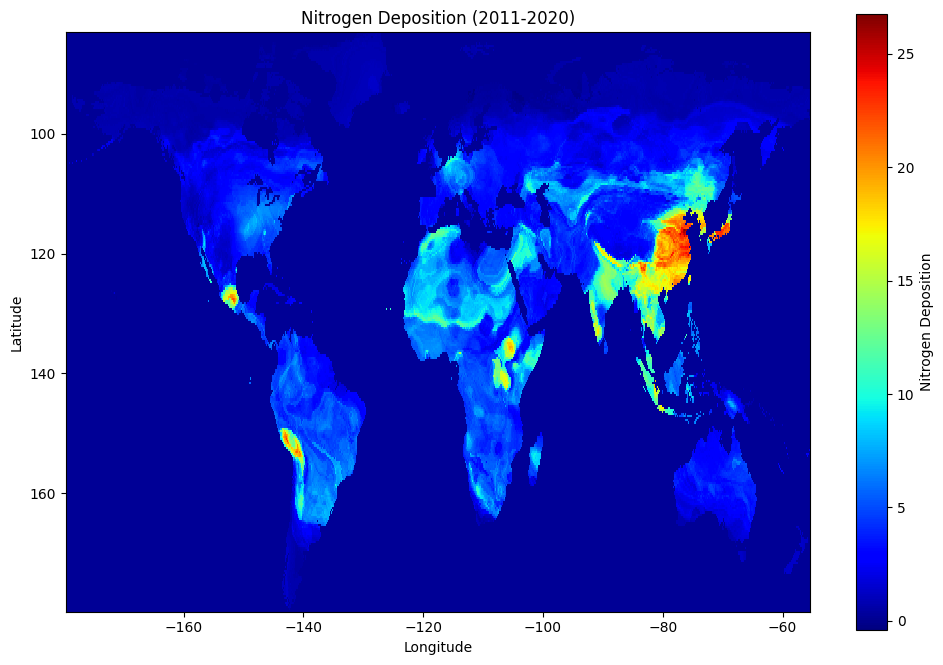

In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# File path to your GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Composite_Pred_2011_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data
    nitrogen_deposition = dataset.read(1)
    
    # Print shape and data type information
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")
    
    # Check if the data is as expected (2D)
    if nitrogen_deposition.ndim == 2:
        # Calculate mean nitrogen deposition
        mean_deposition = nitrogen_deposition  # It's already 2D, no need for mean
    else:
        print("Unexpected data shape. Cannot proceed with plotting.")
        exit()

    # Plotting mean deposition
    plt.figure(figsize=(12, 8))
    plt.imshow(mean_deposition, cmap='jet', interpolation='nearest', extent=dataset.bounds)
    plt.colorbar(label='Nitrogen Deposition')
    plt.title('Nitrogen Deposition (2011-2020)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

Shape of nitrogen_deposition: (277, 719)
Data type: float32


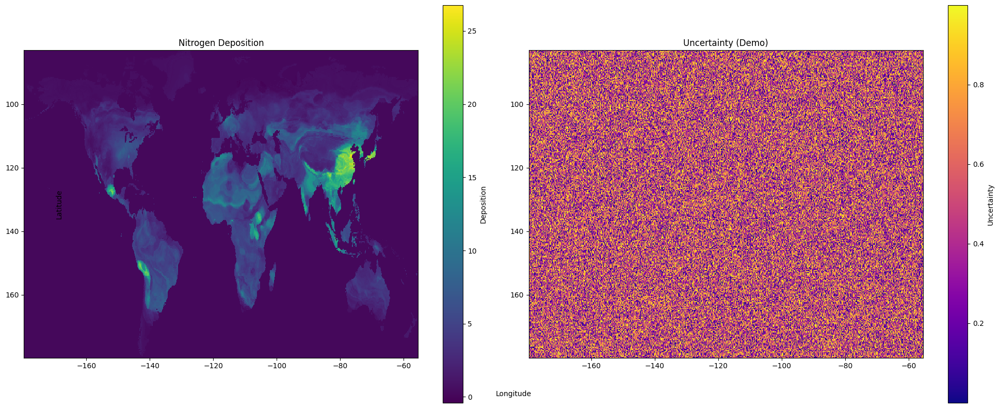


Top 10 areas with highest uncertainty (Demo):
Latitude: 5.804470062255831, Longitude: 82.5625, Uncertainty: 0.999959105800628
Latitude: -32.69552993774417, Longitude: -54.4375, Uncertainty: 0.9999672763833414
Latitude: 53.80447006225583, Longitude: 69.0625, Uncertainty: 0.999971210731636
Latitude: 17.80447006225583, Longitude: 60.0625, Uncertainty: 0.9999722042986103
Latitude: 47.80447006225583, Longitude: 103.0625, Uncertainty: 0.9999745069613583
Latitude: -27.19552993774417, Longitude: -160.9375, Uncertainty: 0.9999784415810615
Latitude: 55.80447006225583, Longitude: 47.0625, Uncertainty: 0.9999821900016623
Latitude: 51.30447006225583, Longitude: 166.5625, Uncertainty: 0.9999858074123295
Latitude: 10.304470062255831, Longitude: -63.4375, Uncertainty: 0.9999949795923887
Latitude: -33.19552993774417, Longitude: -28.9375, Uncertainty: 0.9999960690659419


In [6]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# File path to your GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Composite_Pred_2011_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")

    # Check if the data is 1-dimensional
    if nitrogen_deposition.ndim == 1:
        # Try to reshape the data based on the raster's width and height
        width = dataset.width
        height = dataset.height
        try:
            nitrogen_deposition = nitrogen_deposition.reshape((height, width))
            print(f"Reshaped nitrogen_deposition to: {nitrogen_deposition.shape}")
        except ValueError:
            print("Unable to reshape the data. The file might not contain the expected data structure.")
            exit()

    # Now proceed with the analysis
    mean_deposition = nitrogen_deposition  # It's already 2D, no need for mean across time
    
    # For demonstration, let's calculate some dummy "uncertainty" measure
    # This could be replaced with actual uncertainty data if available
    uncertainty = np.random.rand(*mean_deposition.shape)  # Random values between 0 and 1

    # Create a figure with subplots
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))

    # Plot mean deposition
    im1 = axs[0].imshow(mean_deposition, cmap='viridis', interpolation='nearest', extent=dataset.bounds)
    axs[0].set_title('Nitrogen Deposition')
    plt.colorbar(im1, ax=axs[0], label='Deposition')

    # Plot uncertainty
    im2 = axs[1].imshow(uncertainty, cmap='plasma', interpolation='nearest', extent=dataset.bounds)
    axs[1].set_title('Uncertainty (Demo)')
    plt.colorbar(im2, ax=axs[1], label='Uncertainty')

    # Add common labels
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.06, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()

    # Identify areas with highest uncertainty (for demonstration)
    high_uncertainty_indices = np.unravel_index(np.argsort(uncertainty.ravel())[-10:], uncertainty.shape)
    print("\nTop 10 areas with highest uncertainty (Demo):")
    for i, j in zip(*high_uncertainty_indices):
        print(f"Latitude: {dataset.xy(i, j)[1]}, Longitude: {dataset.xy(i, j)[0]}, Uncertainty: {uncertainty[i, j]}")

Shape of nitrogen_deposition: (277, 719)
Data type: float32


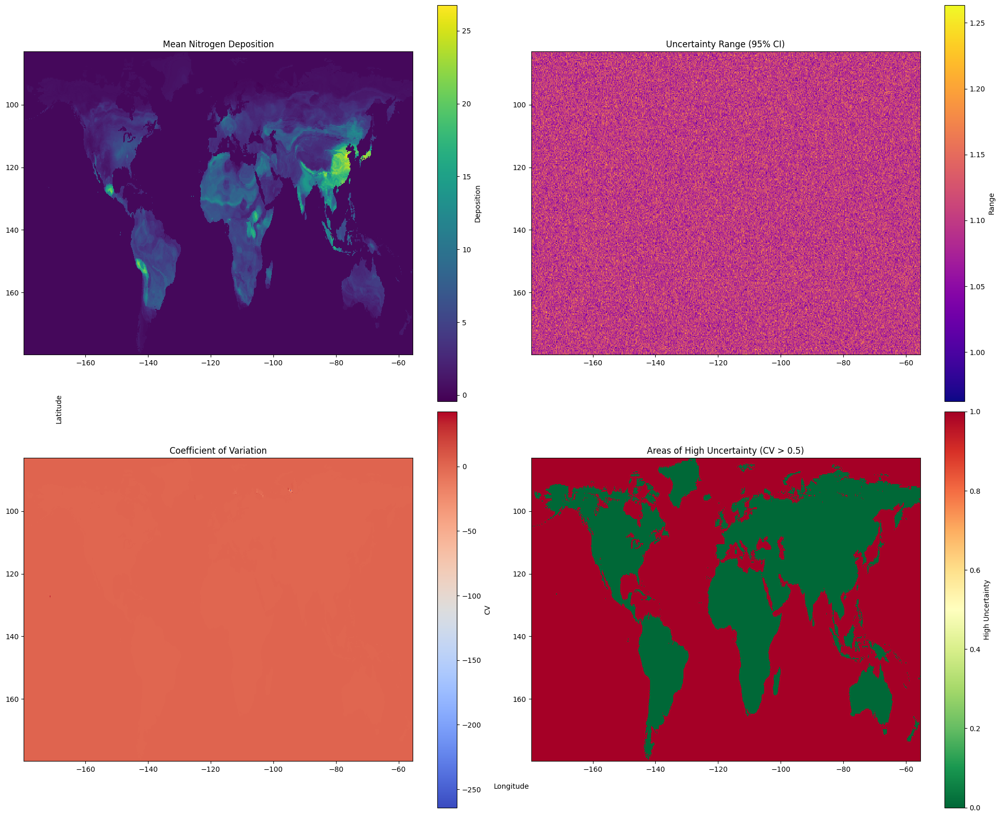


Top 10 areas with highest uncertainty:
Latitude: 67.80447006225583, Longitude: 68.5625, CV: 6.2751294743891375
Latitude: 66.30447006225583, Longitude: 16.0625, CV: 6.682081286284979
Latitude: 68.30447006225583, Longitude: 68.0625, CV: 8.022794955852314
Latitude: 68.80447006225583, Longitude: 65.0625, CV: 8.623756575161865
Latitude: 69.30447006225583, Longitude: 64.5625, CV: 9.898881294608321
Latitude: 19.30447006225583, Longitude: -155.4375, CV: 12.714071405517737
Latitude: 66.80447006225583, Longitude: 35.5625, CV: 13.252217468502407
Latitude: 68.80447006225583, Longitude: 64.5625, CV: 17.72238910866905
Latitude: 67.30447006225583, Longitude: 68.0625, CV: 27.426420221782845
Latitude: 19.80447006225583, Longitude: -155.4375, CV: 42.51517568011784


In [7]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# File path to your GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Composite_Pred_2011_2020.tif'

# Number of Monte Carlo simulations
n_simulations = 1000

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")

    # Check if the data is 1-dimensional and reshape if necessary
    if nitrogen_deposition.ndim == 1:
        width, height = dataset.width, dataset.height
        try:
            nitrogen_deposition = nitrogen_deposition.reshape((height, width))
            print(f"Reshaped nitrogen_deposition to: {nitrogen_deposition.shape}")
        except ValueError:
            print("Unable to reshape the data. The file might not contain the expected data structure.")
            exit()

    # Calculate mean and standard deviation for each pixel
    mean = nitrogen_deposition
    std = np.std(nitrogen_deposition) * 0.1  # Assuming 10% variability, adjust as needed

    # Perform Monte Carlo simulation
    simulations = np.random.normal(mean, std, (n_simulations, *mean.shape))

    # Calculate uncertainty metrics
    lower_ci = np.percentile(simulations, 2.5, axis=0)
    upper_ci = np.percentile(simulations, 97.5, axis=0)
    uncertainty_range = upper_ci - lower_ci
    coefficient_of_variation = np.std(simulations, axis=0) / np.mean(simulations, axis=0)

    # Create a figure with subplots
    fig, axs = plt.subplots(2, 2, figsize=(20, 16))

    # Plot mean deposition
    im1 = axs[0, 0].imshow(mean, cmap='viridis', interpolation='nearest', extent=dataset.bounds)
    axs[0, 0].set_title('Mean Nitrogen Deposition')
    plt.colorbar(im1, ax=axs[0, 0], label='Deposition')

    # Plot uncertainty range
    im2 = axs[0, 1].imshow(uncertainty_range, cmap='plasma', interpolation='nearest', extent=dataset.bounds)
    axs[0, 1].set_title('Uncertainty Range (95% CI)')
    plt.colorbar(im2, ax=axs[0, 1], label='Range')

    # Plot coefficient of variation
    im3 = axs[1, 0].imshow(coefficient_of_variation, cmap='coolwarm', interpolation='nearest', extent=dataset.bounds)
    axs[1, 0].set_title('Coefficient of Variation')
    plt.colorbar(im3, ax=axs[1, 0], label='CV')

    # Plot areas of high uncertainty (e.g., where CV > 0.5)
    high_uncertainty = coefficient_of_variation > 0.5
    im4 = axs[1, 1].imshow(high_uncertainty, cmap='RdYlGn_r', interpolation='nearest', extent=dataset.bounds)
    axs[1, 1].set_title('Areas of High Uncertainty (CV > 0.5)')
    plt.colorbar(im4, ax=axs[1, 1], label='High Uncertainty')

    # Add common labels
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.06, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()

    # Identify areas with highest uncertainty
    high_uncertainty_indices = np.unravel_index(np.argsort(coefficient_of_variation.ravel())[-10:], coefficient_of_variation.shape)
    print("\nTop 10 areas with highest uncertainty:")
    for i, j in zip(*high_uncertainty_indices):
        print(f"Latitude: {dataset.xy(i, j)[1]}, Longitude: {dataset.xy(i, j)[0]}, CV: {coefficient_of_variation[i, j]}")

Shape of nitrogen_deposition: (277, 719)
Data type: float32
Pixel uncertainty data saved to 'pixel_uncertainty_data.csv'

Summary Statistics by Uncertainty Category:
                     Nitrogen_Deposition                                 \
                                    mean       std       min        max   
Uncertainty_Category                                                      
0.0                             0.794136  2.159612  0.163323  25.890341   
1.0                             4.275405  3.471465  0.019171  25.815088   
2.0                             2.019487  3.317827 -0.406232  26.757225   

                            CV                                 
                          mean       std       min        max  
Uncertainty_Category                                           
0.0                   0.009114  0.024101  0.000000   0.099996  
1.0                   0.175750  0.055881  0.100004   0.299981  
2.0                   0.940701  1.026894  0.300005  98.269882  

C:\Users\River-Lab-Model\AppData\Local\Temp\ipykernel_8400\1552435890.py:87: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r', 3)


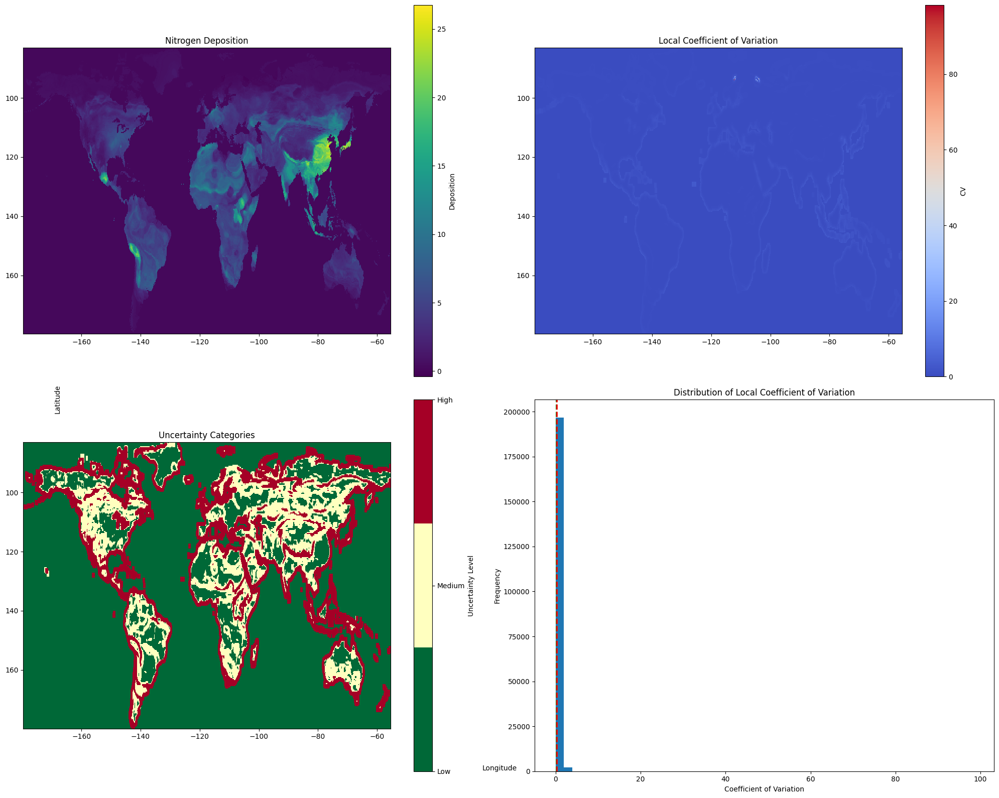

In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter

# File path to your GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Composite_Pred_2011_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")

    # Calculate local mean and standard deviation using a moving window
    window_size = 5  # Adjust this value based on your data resolution
    local_mean = uniform_filter(nitrogen_deposition, size=window_size)
    local_var = uniform_filter(nitrogen_deposition**2, size=window_size) - local_mean**2
    local_std = np.sqrt(np.maximum(local_var, 0))  # Avoid negative values due to floating point errors

    # Calculate local coefficient of variation
    cv_map = np.divide(local_std, np.abs(local_mean), out=np.zeros_like(local_std), where=local_mean!=0)

    # Set CV thresholds based on variability, not area
    low_threshold = 0.1  # CV < 10%
    high_threshold = 0.3  # CV > 30%

    # Categorize uncertainty
    uncertainty_categories = np.ones_like(cv_map)  # Start with all medium
    uncertainty_categories[cv_map < low_threshold] = 0  # Low uncertainty
    uncertainty_categories[cv_map > high_threshold] = 2  # High uncertainty

    # Create a DataFrame with all pixel information
    pixel_data = []
    for i in range(cv_map.shape[0]):
        for j in range(cv_map.shape[1]):
            lat, lon = dataset.xy(i, j)
            pixel_data.append({
                'Latitude': lat,
                'Longitude': lon,
                'Nitrogen_Deposition': nitrogen_deposition[i, j],
                'CV': cv_map[i, j],
                'Uncertainty_Category': uncertainty_categories[i, j]
            })

    df = pd.DataFrame(pixel_data)

    # Save the DataFrame to a CSV file
    df.to_csv('pixel_uncertainty_data.csv', index=False)
    print("Pixel uncertainty data saved to 'pixel_uncertainty_data.csv'")

    # Calculate summary statistics for each uncertainty category
    summary_stats = df.groupby('Uncertainty_Category').agg({
        'Nitrogen_Deposition': ['mean', 'std', 'min', 'max'],
        'CV': ['mean', 'std', 'min', 'max']
    })

    print("\nSummary Statistics by Uncertainty Category:")
    print(summary_stats)

    # Calculate percentage of land area in each category
    total_pixels = len(df)
    category_percentages = df['Uncertainty_Category'].value_counts(normalize=True) * 100

    print("\nPercentage of land area in each uncertainty category:")
    for category, percentage in category_percentages.items():
        category_name = ['Low', 'Medium', 'High'][int(category)]
        print(f"{category_name} uncertainty: {percentage:.2f}%")

    # Create visualizations
    fig, axs = plt.subplots(2, 2, figsize=(20, 16))

    # Plot mean deposition
    im1 = axs[0, 0].imshow(nitrogen_deposition, cmap='viridis', interpolation='nearest', extent=dataset.bounds)
    axs[0, 0].set_title('Nitrogen Deposition')
    plt.colorbar(im1, ax=axs[0, 0], label='Deposition')

    # Plot coefficient of variation
    im2 = axs[0, 1].imshow(cv_map, cmap='coolwarm', interpolation='nearest', extent=dataset.bounds)
    axs[0, 1].set_title('Local Coefficient of Variation')
    plt.colorbar(im2, ax=axs[0, 1], label='CV')

    # Plot uncertainty categories
    cmap = plt.cm.get_cmap('RdYlGn_r', 3)
    im3 = axs[1, 0].imshow(uncertainty_categories, cmap=cmap, interpolation='nearest', extent=dataset.bounds, vmin=0, vmax=2)
    axs[1, 0].set_title('Uncertainty Categories')
    cbar = plt.colorbar(im3, ax=axs[1, 0], label='Uncertainty Level', ticks=[0, 1, 2])
    cbar.ax.set_yticklabels(['Low', 'Medium', 'High'])

    # Plot histogram of CV values
    axs[1, 1].hist(cv_map.ravel(), bins=50)
    axs[1, 1].set_title('Distribution of Local Coefficient of Variation')
    axs[1, 1].set_xlabel('Coefficient of Variation')
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
    axs[1, 1].axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)

    # Add common labels
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.06, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()

Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: 0.20718684792518616, Max value: 32.76665496826172
Filtered min value: 0.20718684792518616, Filtered max value: 32.76665496826172
Land pixels: 199163
Local mean range: 0.9181185960769653 to 31.4102840423584
Local var range: 1e-10 to 100.75454711914062
Beta prior: 6.041475296020508
Alpha post range: 14.5 to 14.5
Beta post range: 6.041475297270508 to 1265.4733142852783
Uncertainty map shape: (277, 719)
Uncertainty min: 0.6689668816067835, max: 9.68187812467869
Number of non-NaN values in uncertainty map: 199163
Number of True values in land_mask: 199163
Low threshold: 0.7701748162998967, High threshold: 1.2663078332167792
Category 0: 149371 pixels (75.00%)
Category 1: 29875 pixels (15.00%)
Category 2: 19917 pixels (10.00%)
Sampled data shape: (19783, 5)
Sampled pixel uncertainty data saved to 'pixel_uncertainty_data_bayesian_sampled_land.csv'

Summary Statistics by Uncertainty Category:
                     Nitrogen_De

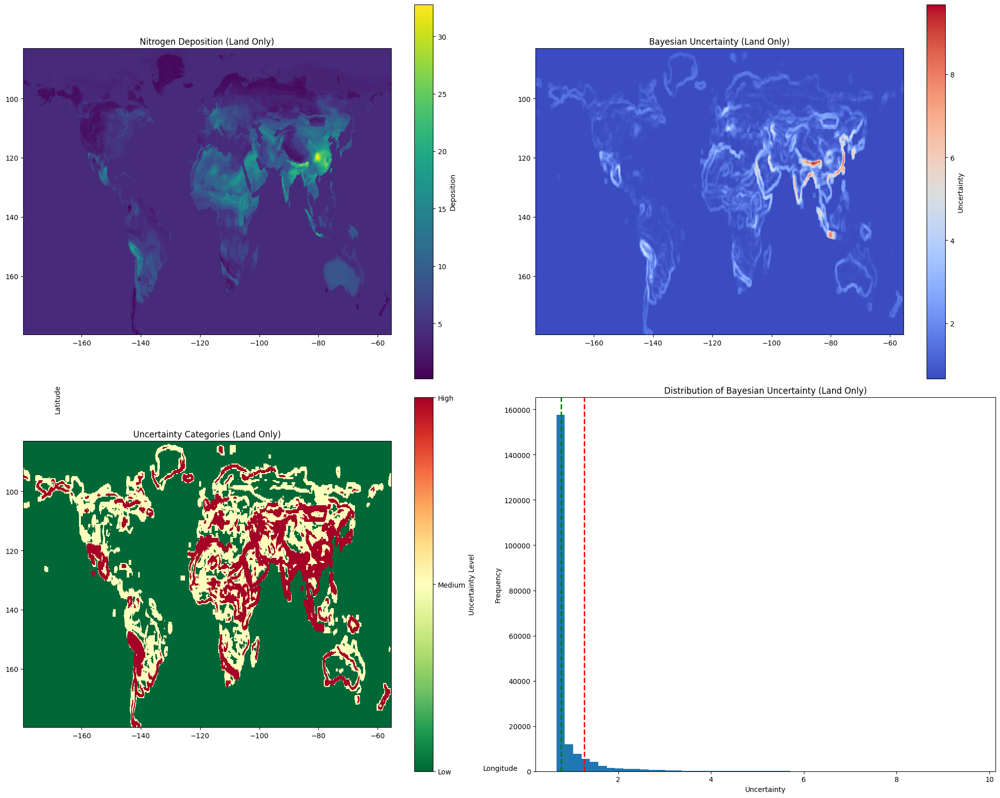

In [30]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter
from scipy.stats import norm

# File path to your land-masked GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Land_Composite_Pred_2005_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data (already masked for land)
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")
    print(f"Min value: {np.min(nitrogen_deposition)}, Max value: {np.max(nitrogen_deposition)}")

    # Filter out extreme negative values (likely no-data values)
    land_mask = nitrogen_deposition > -1e30
    nitrogen_deposition[~land_mask] = np.nan

    print(f"Filtered min value: {np.nanmin(nitrogen_deposition)}, Filtered max value: {np.nanmax(nitrogen_deposition)}")
    print(f"Land pixels: {np.sum(land_mask)}")

    # Function to calculate Bayesian uncertainty
    def bayesian_uncertainty_map(data, window_size):
        # Create a mask for valid (non-NaN) data
        valid_mask = np.isfinite(data)
        
        # Calculate local mean and variance only for valid data
        local_mean = uniform_filter(np.where(valid_mask, data, 0), size=window_size)
        local_mean2 = uniform_filter(np.where(valid_mask, data**2, 0), size=window_size)
        valid_count = uniform_filter(valid_mask.astype(float), size=window_size)
        
        # Avoid division by zero
        valid_count = np.maximum(valid_count, 1e-10)
        
        # Correct the mean and calculate variance
        local_mean /= valid_count
        local_var = (local_mean2 / valid_count) - local_mean**2
        local_var = np.maximum(local_var, 1e-10)  # Avoid negative variance
        
        print(f"Local mean range: {np.nanmin(local_mean)} to {np.nanmax(local_mean)}")
        print(f"Local var range: {np.nanmin(local_var)} to {np.nanmax(local_var)}")
        
        alpha_prior = 2
        beta_prior = np.nanvar(data)
        
        n = window_size**2
        alpha_post = alpha_prior + n/2
        beta_post = beta_prior + 0.5 * n * local_var
        
        print(f"Beta prior: {beta_prior}")
        print(f"Alpha post range: {np.nanmin(alpha_post)} to {np.nanmax(alpha_post)}")
        print(f"Beta post range: {np.nanmin(beta_post)} to {np.nanmax(beta_post)}")
        
        uncertainty = np.sqrt(beta_post / (alpha_post - 1))
        
        # Mask out areas with no valid data
        uncertainty[~valid_mask] = np.nan
        
        return uncertainty

    # Calculate Bayesian uncertainty
    window_size = 5
    uncertainty_map = bayesian_uncertainty_map(nitrogen_deposition, window_size)

    print(f"Uncertainty map shape: {uncertainty_map.shape}")
    print(f"Uncertainty min: {np.nanmin(uncertainty_map)}, max: {np.nanmax(uncertainty_map)}")
    print(f"Number of non-NaN values in uncertainty map: {np.sum(np.isfinite(uncertainty_map))}")
    print(f"Number of True values in land_mask: {np.sum(land_mask)}")

    # Function to adjust threshold
    def adjust_threshold(uncertainty_map, land_mask, target_percentage=0.75):
        valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
        if len(valid_uncertainty) == 0:
            print("No valid uncertainty values found.")
            return None
        return np.percentile(valid_uncertainty, target_percentage * 100)

    # Find the thresholds
    low_threshold = adjust_threshold(uncertainty_map, land_mask)
    high_threshold = adjust_threshold(uncertainty_map, land_mask, target_percentage=0.9)

    if low_threshold is not None and high_threshold is not None:
        print(f"Low threshold: {low_threshold}, High threshold: {high_threshold}")
    else:
        print("Unable to calculate thresholds due to lack of valid data.")
        # Set default thresholds or handle this case as appropriate for your analysis
        low_threshold = np.nanmin(uncertainty_map)
        high_threshold = np.nanmax(uncertainty_map)

    # Categorize uncertainty
    uncertainty_categories = np.ones_like(uncertainty_map, dtype=np.uint8)
    uncertainty_categories[uncertainty_map < low_threshold] = 0  # Low uncertainty
    uncertainty_categories[uncertainty_map > high_threshold] = 2  # High uncertainty

    # Print some statistics about the categories
    for category in range(3):
        count = np.sum(uncertainty_categories == category)
        percentage = count / uncertainty_categories.size * 100
        print(f"Category {category}: {count} pixels ({percentage:.2f}%)")

    # Sample data for DataFrame (to reduce memory usage and processing time)
    sample_rate = 0.1  # 10% of the data
    sample_mask = np.random.choice([False, True], size=uncertainty_map.shape, p=[1-sample_rate, sample_rate])
    
    # Create a DataFrame with sampled pixel information
    pixel_data = pd.DataFrame({
        'Latitude': [dataset.xy(i, j)[0] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Longitude': [dataset.xy(i, j)[1] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Nitrogen_Deposition': nitrogen_deposition[sample_mask & land_mask],
        'Uncertainty': uncertainty_map[sample_mask & land_mask],
        'Uncertainty_Category': uncertainty_categories[sample_mask & land_mask]
    })

    print(f"Sampled data shape: {pixel_data.shape}")

    # Save the DataFrame to a CSV file
    pixel_data.to_csv('pixel_uncertainty_data_bayesian_sampled_land.csv', index=False)
    print("Sampled pixel uncertainty data saved to 'pixel_uncertainty_data_bayesian_sampled_land.csv'")

    # Calculate summary statistics for each uncertainty category
    summary_stats = pixel_data.groupby('Uncertainty_Category').agg({
        'Nitrogen_Deposition': ['mean', 'std', 'min', 'max'],
        'Uncertainty': ['mean', 'std', 'min', 'max']
    })

    print("\nSummary Statistics by Uncertainty Category:")
    print(summary_stats)

    # Calculate percentage of land area in each category
    category_percentages = pixel_data['Uncertainty_Category'].value_counts(normalize=True) * 100

    print("\nPercentage of land area in each uncertainty category:")
    for category, percentage in category_percentages.items():
        category_name = ['Low', 'Medium', 'High'][int(category)]
        print(f"{category_name} uncertainty: {percentage:.2f}%")

    # Create visualizations
    fig, axs = plt.subplots(2, 2, figsize=(20, 16))

    # Plot mean deposition
    im1 = axs[0, 0].imshow(nitrogen_deposition, cmap='viridis', interpolation='nearest', extent=dataset.bounds)
    axs[0, 0].set_title('Nitrogen Deposition (Land Only)')
    plt.colorbar(im1, ax=axs[0, 0], label='Deposition')

    # Plot Bayesian uncertainty
    im2 = axs[0, 1].imshow(uncertainty_map, cmap='coolwarm', interpolation='nearest', extent=dataset.bounds)
    axs[0, 1].set_title('Bayesian Uncertainty (Land Only)')
    plt.colorbar(im2, ax=axs[0, 1], label='Uncertainty')

    # Plot uncertainty categories
    cmap = plt.colormaps.get_cmap('RdYlGn_r')
    im3 = axs[1, 0].imshow(uncertainty_categories, cmap=cmap, interpolation='nearest', extent=dataset.bounds, vmin=0, vmax=2)
    axs[1, 0].set_title('Uncertainty Categories (Land Only)')
    cbar = plt.colorbar(im3, ax=axs[1, 0], label='Uncertainty Level', ticks=[0, 1, 2])
    cbar.ax.set_yticklabels(['Low', 'Medium', 'High'])

    # Plot histogram of uncertainty values
    valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
    axs[1, 1].hist(valid_uncertainty, bins=50)
    axs[1, 1].set_title('Distribution of Bayesian Uncertainty (Land Only)')
    axs[1, 1].set_xlabel('Uncertainty')
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
    axs[1, 1].axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)

    # Add common labels
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.06, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()

In [23]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter
from scipy.stats import norm
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import os

# Define the output directory
output_dir = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0'

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# File path to your land-masked GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Land_Composite_Pred_2011_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data (already masked for land)
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")
    print(f"Min value: {np.min(nitrogen_deposition)}, Max value: {np.max(nitrogen_deposition)}")

    # Filter out extreme negative values (likely no-data values)
    land_mask = nitrogen_deposition > -1e30
    nitrogen_deposition[~land_mask] = np.nan

    print(f"Filtered min value: {np.nanmin(nitrogen_deposition)}, Filtered max value: {np.nanmax(nitrogen_deposition)}")
    print(f"Land pixels: {np.sum(land_mask)}")

    # Function to calculate Bayesian uncertainty
    def bayesian_uncertainty_map(data, window_size):
        # Create a mask for valid (non-NaN) data
        valid_mask = np.isfinite(data)
        
        # Calculate local mean and variance only for valid data
        local_mean = uniform_filter(np.where(valid_mask, data, 0), size=window_size)
        local_mean2 = uniform_filter(np.where(valid_mask, data**2, 0), size=window_size)
        valid_count = uniform_filter(valid_mask.astype(float), size=window_size)
        
        # Avoid division by zero
        valid_count = np.maximum(valid_count, 1e-10)
        
        # Correct the mean and calculate variance
        local_mean /= valid_count
        local_var = (local_mean2 / valid_count) - local_mean**2
        local_var = np.maximum(local_var, 1e-10)  # Avoid negative variance
        
        print(f"Local mean range: {np.nanmin(local_mean)} to {np.nanmax(local_mean)}")
        print(f"Local var range: {np.nanmin(local_var)} to {np.nanmax(local_var)}")
        
        alpha_prior = 2
        beta_prior = np.nanvar(data)
        
        n = window_size**2
        alpha_post = alpha_prior + n/2
        beta_post = beta_prior + 0.5 * n * local_var
        
        print(f"Beta prior: {beta_prior}")
        print(f"Alpha post range: {np.nanmin(alpha_post)} to {np.nanmax(alpha_post)}")
        print(f"Beta post range: {np.nanmin(beta_post)} to {np.nanmax(beta_post)}")
        
        uncertainty = np.sqrt(beta_post / (alpha_post - 1))
        
        # Mask out areas with no valid data
        uncertainty[~valid_mask] = np.nan
        
        return uncertainty

    # Calculate Bayesian uncertainty
    window_size = 5
    uncertainty_map = bayesian_uncertainty_map(nitrogen_deposition, window_size)

    print(f"Uncertainty map shape: {uncertainty_map.shape}")
    print(f"Uncertainty min: {np.nanmin(uncertainty_map)}, max: {np.nanmax(uncertainty_map)}")
    print(f"Number of non-NaN values in uncertainty map: {np.sum(np.isfinite(uncertainty_map))}")
    print(f"Number of True values in land_mask: {np.sum(land_mask)}")

    # Function to adjust threshold
    def adjust_threshold(uncertainty_map, land_mask, target_percentage=0.75):
        valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
        if len(valid_uncertainty) == 0:
            print("No valid uncertainty values found.")
            return None
        return np.percentile(valid_uncertainty, target_percentage * 100)

    # Find the thresholds
    low_threshold = adjust_threshold(uncertainty_map, land_mask)
    high_threshold = adjust_threshold(uncertainty_map, land_mask, target_percentage=0.9)

    if low_threshold is not None and high_threshold is not None:
        print(f"Low threshold: {low_threshold}, High threshold: {high_threshold}")
    else:
        print("Unable to calculate thresholds due to lack of valid data.")
        # Set default thresholds or handle this case as appropriate for your analysis
        low_threshold = np.nanmin(uncertainty_map)
        high_threshold = np.nanmax(uncertainty_map)

    # Categorize uncertainty
    uncertainty_categories = np.ones_like(uncertainty_map, dtype=np.uint8)
    uncertainty_categories[uncertainty_map < low_threshold] = 0  # Low uncertainty
    uncertainty_categories[uncertainty_map > high_threshold] = 2  # High uncertainty

    # Print some statistics about the categories
    for category in range(3):
        count = np.sum(uncertainty_categories == category)
        percentage = count / uncertainty_categories.size * 100
        print(f"Category {category}: {count} pixels ({percentage:.2f}%)")

    # Sample data for DataFrame (to reduce memory usage and processing time)
    sample_rate = 0.1  # 10% of the data
    sample_mask = np.random.choice([False, True], size=uncertainty_map.shape, p=[1-sample_rate, sample_rate])
    
    # Create a DataFrame with sampled pixel information
    pixel_data = pd.DataFrame({
        'Latitude': [dataset.xy(i, j)[0] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Longitude': [dataset.xy(i, j)[1] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Nitrogen_Deposition': nitrogen_deposition[sample_mask & land_mask],
        'Uncertainty': uncertainty_map[sample_mask & land_mask],
        'Uncertainty_Category': uncertainty_categories[sample_mask & land_mask]
    })

    print(f"Sampled data shape: {pixel_data.shape}")

    # Save the DataFrame to a CSV file
    csv_path = os.path.join(output_dir, 'pixel_uncertainty_data_bayesian_sampled_land.csv')
    pixel_data.to_csv(csv_path, index=False)
    print(f"Sampled pixel uncertainty data saved to '{csv_path}'")

    # Calculate summary statistics for each uncertainty category
    summary_stats = pixel_data.groupby('Uncertainty_Category').agg({
        'Nitrogen_Deposition': ['mean', 'std', 'min', 'max'],
        'Uncertainty': ['mean', 'std', 'min', 'max']
    })

    print("\nSummary Statistics by Uncertainty Category:")
    print(summary_stats)

    # Calculate percentage of land area in each category
    category_percentages = pixel_data['Uncertainty_Category'].value_counts(normalize=True) * 100

    print("\nPercentage of land area in each uncertainty category:")
    for category, percentage in category_percentages.items():
        category_name = ['Low', 'Medium', 'High'][int(category)]
        print(f"{category_name} uncertainty: {percentage:.2f}%")

    # Function to save plot as TIFF
    def save_plot_as_tiff(fig, ax, filename, dpi=600):
        canvas = FigureCanvas(fig)
        canvas.draw()
        plt.savefig(os.path.join(output_dir, filename), format='tiff', dpi=dpi, bbox_inches='tight')
        plt.close(fig)

    # Create and save individual plots
    def create_and_save_plot(data, title, filename, cmap='viridis', colorbar_label=''):
        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(data, cmap=cmap, interpolation='nearest', extent=dataset.bounds)
        ax.set_title(title)
        plt.colorbar(im, ax=ax, label=colorbar_label)
        fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
        fig.text(0.04, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')
        save_plot_as_tiff(fig, ax, filename)

    # Plot and save mean deposition
    create_and_save_plot(nitrogen_deposition, 'Nitrogen Deposition (Land Only)', 'nitrogen_deposition.tiff', colorbar_label='Deposition')

    # Plot and save Bayesian uncertainty
    create_and_save_plot(uncertainty_map, 'Bayesian Uncertainty (Land Only)', 'bayesian_uncertainty.tiff', cmap='coolwarm', colorbar_label='Uncertainty')

    # Plot and save uncertainty categories
    fig, ax = plt.subplots(figsize=(10, 8))
    cmap = plt.colormaps.get_cmap('RdYlGn_r')
    im = ax.imshow(uncertainty_categories, cmap=cmap, interpolation='nearest', extent=dataset.bounds, vmin=0, vmax=2)
    ax.set_title('Uncertainty Categories (Land Only)')
    cbar = plt.colorbar(im, ax=ax, label='Uncertainty Level', ticks=[0, 1, 2])
    cbar.ax.set_yticklabels(['Low', 'Medium', 'High'])
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.04, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')
    save_plot_as_tiff(fig, ax, 'uncertainty_categories.tiff')

    # Plot and save histogram of uncertainty values
    fig, ax = plt.subplots(figsize=(10, 8))
    valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
    ax.hist(valid_uncertainty, bins=50)
    ax.set_title('Distribution of Bayesian Uncertainty (Land Only)')
    ax.set_xlabel('Uncertainty')
    ax.set_ylabel('Frequency')
    ax.axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
    ax.axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)
    save_plot_as_tiff(fig, ax, 'uncertainty_histogram.tiff')

print("All outputs have been saved to:", output_dir)

Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: -3.4028234663852886e+38, Max value: 26.757225036621094
Filtered min value: -0.40623193979263306, Filtered max value: 26.757225036621094
Land pixels: 61441
Local mean range: -0.40623196959495544 to 24.27765655517578
Local var range: 1e-10 to 53.29685974121085
Beta prior: 14.80795669555664
Alpha post range: 14.5 to 14.5
Beta post range: 14.80795669680664 to 681.0187034606923
Uncertainty map shape: (277, 719)
Uncertainty min: 1.0473231026025045, max: 7.10252278320719
Number of non-NaN values in uncertainty map: 61441
Number of True values in land_mask: 61441
Low threshold: 1.2617048646180107, High threshold: 1.7371667255163017
Category 0: 46080 pixels (23.14%)
Category 1: 146939 pixels (73.78%)
Category 2: 6144 pixels (3.08%)
Sampled data shape: (6112, 5)
Sampled pixel uncertainty data saved to 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0\pixel_uncertainty_data_bayesian_sampled_land.csv'

Summar

In [24]:
GEOREFERENCE OUTPUT SAVE IN TIFF FORMAT OF UNCERTAINITY ANALYSIS



import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter
from scipy.stats import norm
import os

# Define the output directory
output_dir = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0'

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# File path to your land-masked GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Land_Composite_Pred_2011_2020.tif'

# Function to save as georeferenced TIFF
def save_geotiff(data, output_path, metadata):
    with rasterio.open(output_path, 'w', **metadata) as dst:
        dst.write(data, 1)

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data (already masked for land)
    nitrogen_deposition = dataset.read(1)
    
    # Save metadata for later use
    out_meta = dataset.meta.copy()
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")
    print(f"Min value: {np.min(nitrogen_deposition)}, Max value: {np.max(nitrogen_deposition)}")

    # Filter out extreme negative values (likely no-data values)
    land_mask = nitrogen_deposition > -1e30
    nitrogen_deposition[~land_mask] = np.nan

    print(f"Filtered min value: {np.nanmin(nitrogen_deposition)}, Filtered max value: {np.nanmax(nitrogen_deposition)}")
    print(f"Land pixels: {np.sum(land_mask)}")

    # Function to calculate Bayesian uncertainty
    def bayesian_uncertainty_map(data, window_size):
        # Create a mask for valid (non-NaN) data
        valid_mask = np.isfinite(data)
        
        # Calculate local mean and variance only for valid data
        local_mean = uniform_filter(np.where(valid_mask, data, 0), size=window_size)
        local_mean2 = uniform_filter(np.where(valid_mask, data**2, 0), size=window_size)
        valid_count = uniform_filter(valid_mask.astype(float), size=window_size)
        
        # Avoid division by zero
        valid_count = np.maximum(valid_count, 1e-10)
        
        # Correct the mean and calculate variance
        local_mean /= valid_count
        local_var = (local_mean2 / valid_count) - local_mean**2
        local_var = np.maximum(local_var, 1e-10)  # Avoid negative variance
        
        print(f"Local mean range: {np.nanmin(local_mean)} to {np.nanmax(local_mean)}")
        print(f"Local var range: {np.nanmin(local_var)} to {np.nanmax(local_var)}")
        
        alpha_prior = 2
        beta_prior = np.nanvar(data)
        
        n = window_size**2
        alpha_post = alpha_prior + n/2
        beta_post = beta_prior + 0.5 * n * local_var
        
        print(f"Beta prior: {beta_prior}")
        print(f"Alpha post range: {np.nanmin(alpha_post)} to {np.nanmax(alpha_post)}")
        print(f"Beta post range: {np.nanmin(beta_post)} to {np.nanmax(beta_post)}")
        
        uncertainty = np.sqrt(beta_post / (alpha_post - 1))
        
        # Mask out areas with no valid data
        uncertainty[~valid_mask] = np.nan
        
        return uncertainty

    # Calculate Bayesian uncertainty
    window_size = 5
    uncertainty_map = bayesian_uncertainty_map(nitrogen_deposition, window_size)

    print(f"Uncertainty map shape: {uncertainty_map.shape}")
    print(f"Uncertainty min: {np.nanmin(uncertainty_map)}, max: {np.nanmax(uncertainty_map)}")
    print(f"Number of non-NaN values in uncertainty map: {np.sum(np.isfinite(uncertainty_map))}")
    print(f"Number of True values in land_mask: {np.sum(land_mask)}")

    # Function to adjust threshold
    def adjust_threshold(uncertainty_map, land_mask, target_percentage=0.75):
        valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
        if len(valid_uncertainty) == 0:
            print("No valid uncertainty values found.")
            return None
        return np.percentile(valid_uncertainty, target_percentage * 100)

    # Find the thresholds
    low_threshold = adjust_threshold(uncertainty_map, land_mask)
    high_threshold = adjust_threshold(uncertainty_map, land_mask, target_percentage=0.9)

    if low_threshold is not None and high_threshold is not None:
        print(f"Low threshold: {low_threshold}, High threshold: {high_threshold}")
    else:
        print("Unable to calculate thresholds due to lack of valid data.")
        # Set default thresholds or handle this case as appropriate for your analysis
        low_threshold = np.nanmin(uncertainty_map)
        high_threshold = np.nanmax(uncertainty_map)

    # Categorize uncertainty
    uncertainty_categories = np.ones_like(uncertainty_map, dtype=np.uint8)
    uncertainty_categories[uncertainty_map < low_threshold] = 0  # Low uncertainty
    uncertainty_categories[uncertainty_map > high_threshold] = 2  # High uncertainty

    # Print some statistics about the categories
    for category in range(3):
        count = np.sum(uncertainty_categories == category)
        percentage = count / uncertainty_categories.size * 100
        print(f"Category {category}: {count} pixels ({percentage:.2f}%)")

    # Sample data for DataFrame (to reduce memory usage and processing time)
    sample_rate = 0.1  # 10% of the data
    sample_mask = np.random.choice([False, True], size=uncertainty_map.shape, p=[1-sample_rate, sample_rate])
    
    # Create a DataFrame with sampled pixel information
    pixel_data = pd.DataFrame({
        'Latitude': [dataset.xy(i, j)[0] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Longitude': [dataset.xy(i, j)[1] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Nitrogen_Deposition': nitrogen_deposition[sample_mask & land_mask],
        'Uncertainty': uncertainty_map[sample_mask & land_mask],
        'Uncertainty_Category': uncertainty_categories[sample_mask & land_mask]
    })

    print(f"Sampled data shape: {pixel_data.shape}")

    # Save the DataFrame to a CSV file
    csv_path = os.path.join(output_dir, 'pixel_uncertainty_data_bayesian_sampled_land.csv')
    pixel_data.to_csv(csv_path, index=False)
    print(f"Sampled pixel uncertainty data saved to '{csv_path}'")

    # Calculate summary statistics for each uncertainty category
    summary_stats = pixel_data.groupby('Uncertainty_Category').agg({
        'Nitrogen_Deposition': ['mean', 'std', 'min', 'max'],
        'Uncertainty': ['mean', 'std', 'min', 'max']
    })

    print("\nSummary Statistics by Uncertainty Category:")
    print(summary_stats)

    # Calculate percentage of land area in each category
    category_percentages = pixel_data['Uncertainty_Category'].value_counts(normalize=True) * 100

    print("\nPercentage of land area in each uncertainty category:")
    for category, percentage in category_percentages.items():
        category_name = ['Low', 'Medium', 'High'][int(category)]
        print(f"{category_name} uncertainty: {percentage:.2f}%")

    # Save georeferenced TIFFs
    save_geotiff(nitrogen_deposition, os.path.join(output_dir, 'nitrogen_deposition.tif'), out_meta)
    save_geotiff(uncertainty_map, os.path.join(output_dir, 'bayesian_uncertainty.tif'), out_meta)
    save_geotiff(uncertainty_categories, os.path.join(output_dir, 'uncertainty_categories.tif'), out_meta)

    # Plot and save histogram of uncertainty values
    fig, ax = plt.subplots(figsize=(10, 8))
    valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
    ax.hist(valid_uncertainty, bins=50)
    ax.set_title('Distribution of Bayesian Uncertainty (Land Only)')
    ax.set_xlabel('Uncertainty')
    ax.set_ylabel('Frequency')
    ax.axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
    ax.axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)
    plt.savefig(os.path.join(output_dir, 'uncertainty_histogram.png'), dpi=300, bbox_inches='tight')
    plt.close(fig)

print("All outputs have been saved to:", output_dir)

Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: -3.4028234663852886e+38, Max value: 26.757225036621094
Filtered min value: -0.40623193979263306, Filtered max value: 26.757225036621094
Land pixels: 61441
Local mean range: -0.40623196959495544 to 24.27765655517578
Local var range: 1e-10 to 53.29685974121085
Beta prior: 14.80795669555664
Alpha post range: 14.5 to 14.5
Beta post range: 14.80795669680664 to 681.0187034606923
Uncertainty map shape: (277, 719)
Uncertainty min: 1.0473231026025045, max: 7.10252278320719
Number of non-NaN values in uncertainty map: 61441
Number of True values in land_mask: 61441
Low threshold: 1.2617048646180107, High threshold: 1.7371667255163017
Category 0: 46080 pixels (23.14%)
Category 1: 146939 pixels (73.78%)
Category 2: 6144 pixels (3.08%)
Sampled data shape: (6218, 5)
Sampled pixel uncertainty data saved to 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0\pixel_uncertainty_data_bayesian_sampled_land.csv'

Summar

In [27]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter
import os

# Define the output directory
output_dir = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0'

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# File path to your land-masked GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Land_Composite_Pred_2011_2020.tif'

# Function to save as georeferenced TIFF
def save_geotiff(data, output_path, metadata):
    with rasterio.open(output_path, 'w', **metadata) as dst:
        dst.write(data, 1)

# Function to calculate Bayesian uncertainty
def bayesian_uncertainty_map(data, window_size):
    valid_mask = np.isfinite(data)
    local_mean = uniform_filter(np.where(valid_mask, data, 0), size=window_size)
    local_mean2 = uniform_filter(np.where(valid_mask, data**2, 0), size=window_size)
    valid_count = uniform_filter(valid_mask.astype(float), size=window_size)
    valid_count = np.maximum(valid_count, 1e-10)
    local_mean /= valid_count
    local_var = (local_mean2 / valid_count) - local_mean**2
    local_var = np.maximum(local_var, 1e-10)
    
    alpha_prior = 2
    beta_prior = np.nanvar(data)
    n = window_size**2
    alpha_post = alpha_prior + n/2
    beta_post = beta_prior + 0.5 * n * local_var
    
    uncertainty = np.sqrt(beta_post / (alpha_post - 1))
    uncertainty[~valid_mask] = np.nan
    return uncertainty

# Function to adjust threshold
def adjust_threshold(uncertainty_map, land_mask, target_percentage=0.75):
    valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
    if len(valid_uncertainty) == 0:
        print("No valid uncertainty values found.")
        return None
    return np.percentile(valid_uncertainty, target_percentage * 100)

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Save metadata for later use
    out_meta = dataset.meta.copy()
    
    # Update the metadata to reflect that we're writing single band files
    out_meta.update(count=1)
    
    # Assuming the data is stored as separate bands for each year
    for year, band in enumerate(range(1, 11), start=2011):
        # Read the nitrogen deposition data for the current year
        nitrogen_deposition = dataset.read(band)
        
        print(f"\nProcessing year {year}")
        print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
        print(f"Data type: {nitrogen_deposition.dtype}")
        print(f"Min value: {np.min(nitrogen_deposition)}, Max value: {np.max(nitrogen_deposition)}")

        # Filter out extreme negative values (likely no-data values)
        land_mask = nitrogen_deposition > -1e30
        nitrogen_deposition[~land_mask] = np.nan

        print(f"Filtered min value: {np.nanmin(nitrogen_deposition)}, Filtered max value: {np.nanmax(nitrogen_deposition)}")
        print(f"Land pixels: {np.sum(land_mask)}")

        # Save georeferenced TIFF for the current year's nitrogen deposition
        save_geotiff(nitrogen_deposition, os.path.join(output_dir, f'nitrogen_deposition_{year}.tif'), out_meta)
        print(f"Saved nitrogen deposition for {year}")

        # Calculate Bayesian uncertainty
        window_size = 5
        uncertainty_map = bayesian_uncertainty_map(nitrogen_deposition, window_size)

        print(f"Uncertainty map shape: {uncertainty_map.shape}")
        print(f"Uncertainty min: {np.nanmin(uncertainty_map)}, max: {np.nanmax(uncertainty_map)}")

        # Save georeferenced TIFF for the current year's uncertainty map
        save_geotiff(uncertainty_map, os.path.join(output_dir, f'bayesian_uncertainty_{year}.tif'), out_meta)
        print(f"Saved Bayesian uncertainty for {year}")

        # Find the thresholds
        low_threshold = adjust_threshold(uncertainty_map, land_mask)
        high_threshold = adjust_threshold(uncertainty_map, land_mask, target_percentage=0.9)

        if low_threshold is not None and high_threshold is not None:
            print(f"Low threshold: {low_threshold}, High threshold: {high_threshold}")
        else:
            print("Unable to calculate thresholds due to lack of valid data.")
            low_threshold = np.nanmin(uncertainty_map)
            high_threshold = np.nanmax(uncertainty_map)

        # Categorize uncertainty
        uncertainty_categories = np.ones_like(uncertainty_map, dtype=np.uint8)
        uncertainty_categories[uncertainty_map < low_threshold] = 0  # Low uncertainty
        uncertainty_categories[uncertainty_map > high_threshold] = 2  # High uncertainty

        # Save georeferenced TIFF for the current year's uncertainty categories
        save_geotiff(uncertainty_categories, os.path.join(output_dir, f'uncertainty_categories_{year}.tif'), out_meta)
        print(f"Saved uncertainty categories for {year}")

        # Plot and save histogram of uncertainty values
        fig, ax = plt.subplots(figsize=(10, 8))
        valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
        ax.hist(valid_uncertainty, bins=50)
        ax.set_title(f'Distribution of Bayesian Uncertainty (Land Only) - {year}')
        ax.set_xlabel('Uncertainty')
        ax.set_ylabel('Frequency')
        ax.axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
        ax.axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)
        plt.savefig(os.path.join(output_dir, f'uncertainty_histogram_{year}.png'), dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"Saved uncertainty histogram for {year}")

print("All outputs have been saved to:", output_dir)


Processing year 2011
Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: -3.4028234663852886e+38, Max value: 26.757225036621094
Filtered min value: -0.40623193979263306, Filtered max value: 26.757225036621094
Land pixels: 61441
Saved nitrogen deposition for 2011
Uncertainty map shape: (277, 719)
Uncertainty min: 1.0473231026025045, max: 7.10252278320719
Saved Bayesian uncertainty for 2011
Low threshold: 1.2617048646180107, High threshold: 1.7371667255163017
Saved uncertainty categories for 2011
Saved uncertainty histogram for 2011

Processing year 2012
Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: -3.4028234663852886e+38, Max value: 29.043550491333008
Filtered min value: -0.11093325167894363, Filtered max value: 29.043550491333008
Land pixels: 61441
Saved nitrogen deposition for 2012
Uncertainty map shape: (277, 719)
Uncertainty min: 1.005464880210509, max: 8.443146658884165
Saved Bayesian uncertainty for 2012
Low threshold: 1.17439810270653

Shape of nitrogen_deposition: (277, 719)
Data type: float32
Min value: 0.20718684792518616, Max value: 32.76665496826172
Filtered min value: 0.20718684792518616, Filtered max value: 32.76665496826172
Land pixels: 199163
Local mean range: 0.7254547476768494 to 32.216087341308594
Local var range: 1e-10 to 88.30714416503906
Beta prior: 6.041475296020508
Alpha post range: 6.5 to 6.5
Beta post range: 6.041475296470508 to 403.4236240386963
Uncertainty map shape: (277, 719)
Uncertainty min: 1.0480696798895237, max: 8.564446848758973
Number of non-NaN values in uncertainty map: 199163
Number of True values in land_mask: 199163
Low threshold: 1.0880546056459863, High threshold: 1.247630978194416
Category 0: 159330 pixels (80.00%)
Category 1: 19917 pixels (10.00%)
Category 2: 19916 pixels (10.00%)
Sampled data shape: (19842, 5)
Sampled pixel uncertainty data saved to 'pixel_uncertainty_data_bayesian_sampled_land.csv'

Summary Statistics by Uncertainty Category:
                     Nitrogen_Depo

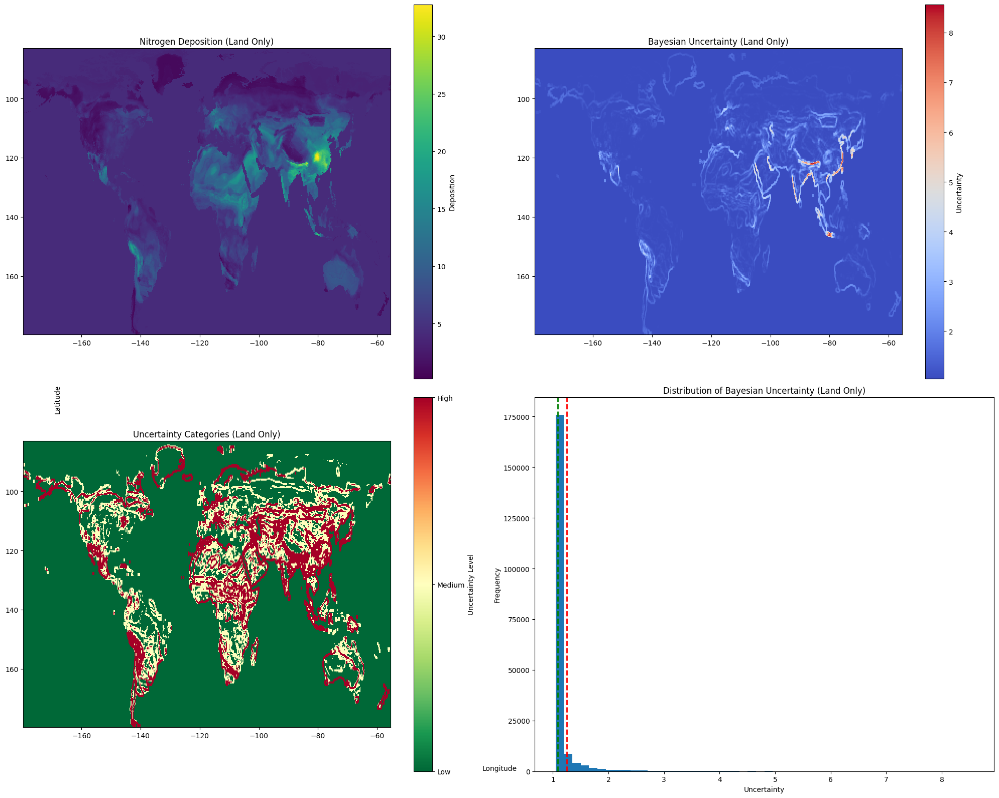

In [33]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter
from scipy.stats import norm

# File path to your land-masked GeoTIFF file
file_path = 'F:/PhD Work/NOx_NH3_Conference/Global N deposition_1/Prediction_4.0/Land_Composite_Pred_2005_2020.tif'

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read the nitrogen deposition data (already masked for land)
    nitrogen_deposition = dataset.read(1)
    
    print(f"Shape of nitrogen_deposition: {nitrogen_deposition.shape}")
    print(f"Data type: {nitrogen_deposition.dtype}")
    print(f"Min value: {np.min(nitrogen_deposition)}, Max value: {np.max(nitrogen_deposition)}")

    # Filter out extreme negative values (likely no-data values)
    land_mask = nitrogen_deposition > -1e30
    nitrogen_deposition[~land_mask] = np.nan

    print(f"Filtered min value: {np.nanmin(nitrogen_deposition)}, Filtered max value: {np.nanmax(nitrogen_deposition)}")
    print(f"Land pixels: {np.sum(land_mask)}")

    # Function to calculate Bayesian uncertainty
    def bayesian_uncertainty_map(data, window_size):
        # Create a mask for valid (non-NaN) data
        valid_mask = np.isfinite(data)
        
        # Calculate local mean and variance only for valid data
        local_mean = uniform_filter(np.where(valid_mask, data, 0), size=window_size)
        local_mean2 = uniform_filter(np.where(valid_mask, data**2, 0), size=window_size)
        valid_count = uniform_filter(valid_mask.astype(float), size=window_size)
        
        # Avoid division by zero
        valid_count = np.maximum(valid_count, 1e-10)
        
        # Correct the mean and calculate variance
        local_mean /= valid_count
        local_var = (local_mean2 / valid_count) - local_mean**2
        local_var = np.maximum(local_var, 1e-10)  # Avoid negative variance
        
        print(f"Local mean range: {np.nanmin(local_mean)} to {np.nanmax(local_mean)}")
        print(f"Local var range: {np.nanmin(local_var)} to {np.nanmax(local_var)}")
        
        alpha_prior = 2
        beta_prior = np.nanvar(data)
        
        n = window_size**2
        alpha_post = alpha_prior + n/2
        beta_post = beta_prior + 0.5 * n * local_var
        
        print(f"Beta prior: {beta_prior}")
        print(f"Alpha post range: {np.nanmin(alpha_post)} to {np.nanmax(alpha_post)}")
        print(f"Beta post range: {np.nanmin(beta_post)} to {np.nanmax(beta_post)}")
        
        uncertainty = np.sqrt(beta_post / (alpha_post - 1))
        
        # Mask out areas with no valid data
        uncertainty[~valid_mask] = np.nan
        
        return uncertainty

    # Calculate Bayesian uncertainty
    window_size = 3
    uncertainty_map = bayesian_uncertainty_map(nitrogen_deposition, window_size)

    print(f"Uncertainty map shape: {uncertainty_map.shape}")
    print(f"Uncertainty min: {np.nanmin(uncertainty_map)}, max: {np.nanmax(uncertainty_map)}")
    print(f"Number of non-NaN values in uncertainty map: {np.sum(np.isfinite(uncertainty_map))}")
    print(f"Number of True values in land_mask: {np.sum(land_mask)}")

    # Function to adjust threshold
    def adjust_threshold(uncertainty_map, land_mask, target_percentage=0.80):
        valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
        if len(valid_uncertainty) == 0:
            print("No valid uncertainty values found.")
            return None
        return np.percentile(valid_uncertainty, target_percentage * 100)

    # Find the thresholds
    low_threshold = adjust_threshold(uncertainty_map, land_mask)
    high_threshold = adjust_threshold(uncertainty_map, land_mask, target_percentage=0.9)

    if low_threshold is not None and high_threshold is not None:
        print(f"Low threshold: {low_threshold}, High threshold: {high_threshold}")
    else:
        print("Unable to calculate thresholds due to lack of valid data.")
        # Set default thresholds or handle this case as appropriate for your analysis
        low_threshold = np.nanmin(uncertainty_map)
        high_threshold = np.nanmax(uncertainty_map)

    # Categorize uncertainty
    uncertainty_categories = np.ones_like(uncertainty_map, dtype=np.uint8)
    uncertainty_categories[uncertainty_map < low_threshold] = 0  # Low uncertainty
    uncertainty_categories[uncertainty_map > high_threshold] = 2  # High uncertainty

    # Print some statistics about the categories
    for category in range(3):
        count = np.sum(uncertainty_categories == category)
        percentage = count / uncertainty_categories.size * 100
        print(f"Category {category}: {count} pixels ({percentage:.2f}%)")

    # Sample data for DataFrame (to reduce memory usage and processing time)
    sample_rate = 0.1  # 10% of the data
    sample_mask = np.random.choice([False, True], size=uncertainty_map.shape, p=[1-sample_rate, sample_rate])
    
    # Create a DataFrame with sampled pixel information
    pixel_data = pd.DataFrame({
        'Latitude': [dataset.xy(i, j)[0] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Longitude': [dataset.xy(i, j)[1] for i, j in zip(*np.where(sample_mask & land_mask))],
        'Nitrogen_Deposition': nitrogen_deposition[sample_mask & land_mask],
        'Uncertainty': uncertainty_map[sample_mask & land_mask],
        'Uncertainty_Category': uncertainty_categories[sample_mask & land_mask]
    })

    print(f"Sampled data shape: {pixel_data.shape}")

    # Save the DataFrame to a CSV file
    pixel_data.to_csv('pixel_uncertainty_data_bayesian_sampled_land.csv', index=False)
    print("Sampled pixel uncertainty data saved to 'pixel_uncertainty_data_bayesian_sampled_land.csv'")

    # Calculate summary statistics for each uncertainty category
    summary_stats = pixel_data.groupby('Uncertainty_Category').agg({
        'Nitrogen_Deposition': ['mean', 'std', 'min', 'max'],
        'Uncertainty': ['mean', 'std', 'min', 'max']
    })

    print("\nSummary Statistics by Uncertainty Category:")
    print(summary_stats)

    # Calculate percentage of land area in each category
    category_percentages = pixel_data['Uncertainty_Category'].value_counts(normalize=True) * 100

    print("\nPercentage of land area in each uncertainty category:")
    for category, percentage in category_percentages.items():
        category_name = ['Low', 'Medium', 'High'][int(category)]
        print(f"{category_name} uncertainty: {percentage:.2f}%")

    # Create visualizations
    fig, axs = plt.subplots(2, 2, figsize=(20, 16))

    # Plot mean deposition
    im1 = axs[0, 0].imshow(nitrogen_deposition, cmap='viridis', interpolation='nearest', extent=dataset.bounds)
    axs[0, 0].set_title('Nitrogen Deposition (Land Only)')
    plt.colorbar(im1, ax=axs[0, 0], label='Deposition')

    # Plot Bayesian uncertainty
    im2 = axs[0, 1].imshow(uncertainty_map, cmap='coolwarm', interpolation='nearest', extent=dataset.bounds)
    axs[0, 1].set_title('Bayesian Uncertainty (Land Only)')
    plt.colorbar(im2, ax=axs[0, 1], label='Uncertainty')

    # Plot uncertainty categories
    cmap = plt.colormaps.get_cmap('RdYlGn_r')
    im3 = axs[1, 0].imshow(uncertainty_categories, cmap=cmap, interpolation='nearest', extent=dataset.bounds, vmin=0, vmax=2)
    axs[1, 0].set_title('Uncertainty Categories (Land Only)')
    cbar = plt.colorbar(im3, ax=axs[1, 0], label='Uncertainty Level', ticks=[0, 1, 2])
    cbar.ax.set_yticklabels(['Low', 'Medium', 'High'])

    # Plot histogram of uncertainty values
    valid_uncertainty = uncertainty_map[land_mask & np.isfinite(uncertainty_map)]
    axs[1, 1].hist(valid_uncertainty, bins=50)
    axs[1, 1].set_title('Distribution of Bayesian Uncertainty (Land Only)')
    axs[1, 1].set_xlabel('Uncertainty')
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].axvline(low_threshold, color='g', linestyle='dashed', linewidth=2)
    axs[1, 1].axvline(high_threshold, color='r', linestyle='dashed', linewidth=2)

    # Add common labels
    fig.text(0.5, 0.04, 'Longitude', ha='center', va='center')
    fig.text(0.06, 0.5, 'Latitude', ha='center', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()

In [26]:
import geopandas as gpd

# Load the shapefile for countries
shapefile_path = 'F:/PhD Work/World_Countries_(Generalized)_-573431906301700955/World_Countries_Generalized.shp'
world_countries = gpd.read_file(shapefile_path)

# Print the column names to identify where country names are stored
print(world_countries.columns)


Index(['COUNTRY', 'ISO', 'COUNTRYAFF', 'AFF_ISO', 'geometry'], dtype='object')


CV Data Min: 5.791835308074951, Max: 243.3269500732422
Plotting Coefficient of Variation...


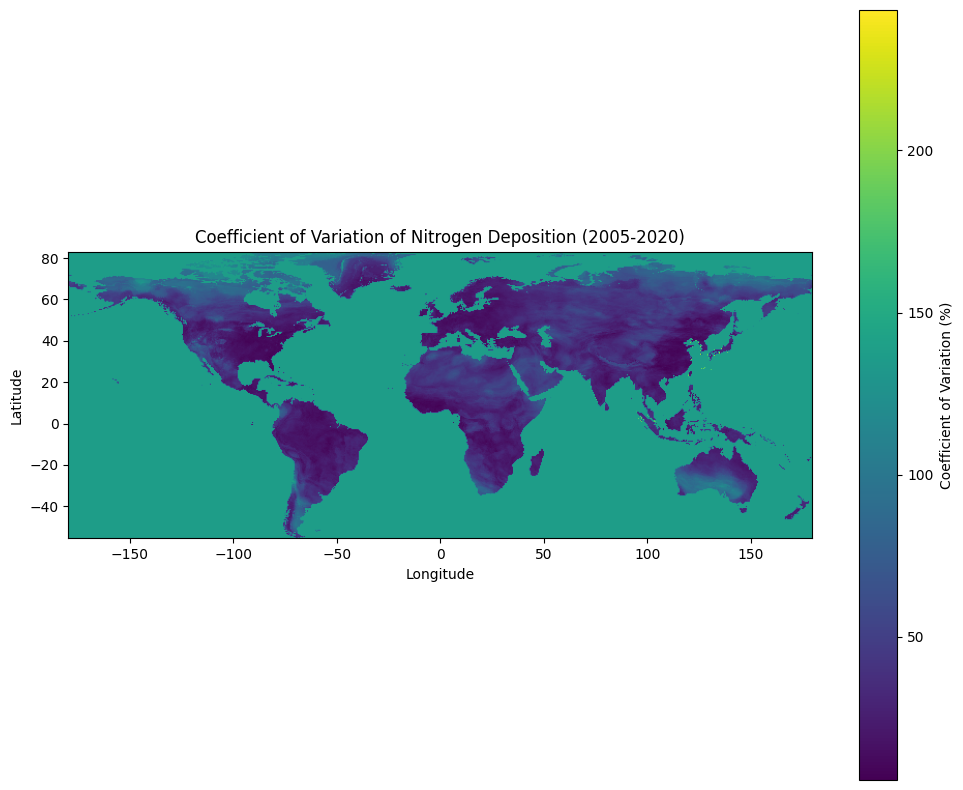

In [31]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from affine import Affine

# Function to load multi-band raster data
def load_multiband_raster(file_path):
    with rasterio.open(file_path) as src:
        bands = [src.read(i + 1) for i in range(src.count)]
        meta = src.meta
    return np.array(bands), meta

# Function to clean raster data by removing NaN and negative values
def clean_raster_data(raster_data):
    cleaned_data = np.copy(raster_data)
    cleaned_data[np.isnan(cleaned_data)] = 0
    cleaned_data[cleaned_data < 0] = 0
    return cleaned_data

# Function to calculate Coefficient of Variation (CV) pixel-wise
def calculate_pixelwise_cv(data):
    mean = np.nanmean(data, axis=0)
    std_dev = np.nanstd(data, axis=0)
    cv = (std_dev / mean) * 100
    cv[mean == 0] = np.nan  # Avoid division by zero and set CV to NaN where mean is zero
    return cv

# Function to plot raster data with correct transform handling
def plot_raster(data, transform, title):
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Convert Affine transform to extent
    transform = Affine(*transform)  # Ensure we have an Affine object
    a, b, c, d, e, f = transform.to_gdal()
    
    # Calculate extent based on the transform and raster dimensions
    width, height = data.shape[1], data.shape[0]
    extent = (c, c + a * width, f + e * height, f)
    
    # Print debug information
    print(f"Transform: {transform}")
    print(f"Width: {width}, Height: {height}")
    print(f"Extent: {extent}")
    
    # Validate extent values
    if np.all(np.isfinite([extent[0], extent[1], extent[2], extent[3]])):
        import rasterio
from rasterio.plot import show

def plot_raster(data, transform, title):
    fig, ax = plt.subplots(figsize=(12, 10))
    
    show(data, ax=ax, transform=transform, cmap='viridis')
    
    cbar = plt.colorbar(ax.images[0], ax=ax, orientation='vertical')
    cbar.set_label('Coefficient of Variation (%)')
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()
# File paths for input
composite_file = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Land_Composite_Pred_2005_2020.tif"

# Load the multi-band raster
composite_data, meta = load_multiband_raster(composite_file)
transform = meta['transform']

# Clean the composite data
cleaned_data = np.array([clean_raster_data(band) for band in composite_data])

# Calculate Coefficient of Variation (CV) pixel-wise
cv_data = calculate_pixelwise_cv(cleaned_data)

# Print statistics for debugging
print(f"CV Data Min: {np.nanmin(cv_data)}, Max: {np.nanmax(cv_data)}")

# Plot the CV raster
print("Plotting Coefficient of Variation...")
plot_raster(cv_data, transform, "Coefficient of Variation of Nitrogen Deposition (2005-2020)")


CV Data Min: 5.791835308074951, Max: 243.3269500732422
Saving Coefficient of Variation as GeoTIFF...
GeoTIFF saved to F:\PhD Work\NOx_NH3_Conference\Global N deposition_1\Prediction_4.0\Coefficient_of_Variation\Coefficient_of_Variation_Nitrogen_Deposition_2005_2020.tif
Plotting Coefficient of Variation...


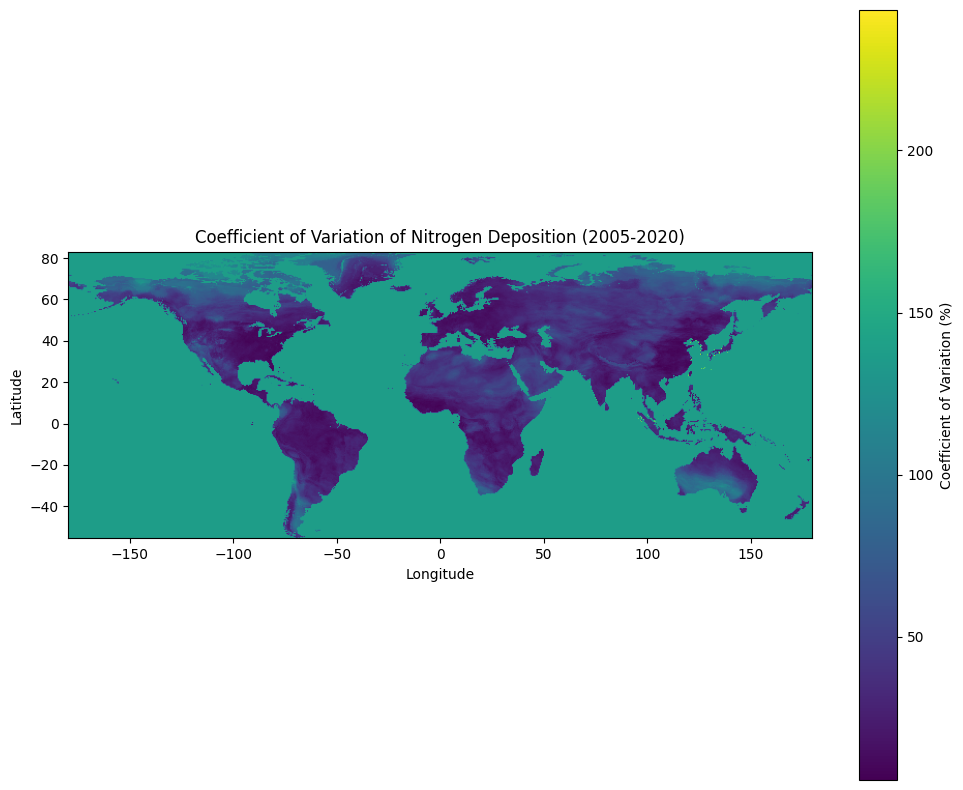

In [35]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from rasterio.transform import from_origin
from affine import Affine
import os

# Function to load multi-band raster data
def load_multiband_raster(file_path):
    with rasterio.open(file_path) as src:
        bands = [src.read(i + 1) for i in range(src.count)]
        meta = src.meta
    return np.array(bands), meta

# Function to clean raster data by removing NaN and negative values
def clean_raster_data(raster_data):
    cleaned_data = np.copy(raster_data)
    cleaned_data[np.isnan(cleaned_data)] = 0
    cleaned_data[cleaned_data < 0] = 0
    return cleaned_data

# Function to calculate Coefficient of Variation (CV) pixel-wise
def calculate_pixelwise_cv(data):
    mean = np.nanmean(data, axis=0)
    std_dev = np.nanstd(data, axis=0)
    cv = (std_dev / mean) * 100
    cv[mean == 0] = np.nan  # Avoid division by zero and set CV to NaN where mean is zero
    return cv

# Function to save raster data as GeoTIFF
def save_raster_as_geotiff(data, transform, meta, output_path):
    meta.update({
        'count': 1,
        'dtype': 'float32',
        'compress': 'lzw'
    })
    
    with rasterio.open(output_path, 'w', **meta) as dst:
        dst.write(data, 1)
    print(f"GeoTIFF saved to {output_path}")

# Function to plot raster data (optional, for visualization)
def plot_raster(data, transform, title):
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot the data using rasterio's show
    show(data, ax=ax, transform=transform, cmap='viridis')
    
    # Add colorbar
    cbar = plt.colorbar(ax.images[0], ax=ax, orientation='vertical')
    cbar.set_label('Coefficient of Variation (%)')
    
    # Set title and labels
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    # Show plot
    plt.show()

# File paths for input
composite_file = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Land_Composite_Pred_2005_2020.tif"
output_folder = os.path.join(os.path.dirname(composite_file), "Coefficient_of_Variation")

# Ensure the output directory exists
os.makedirs(output_folder, exist_ok=True)

# Load the multi-band raster
composite_data, meta = load_multiband_raster(composite_file)
transform = meta['transform']

# Clean the composite data
cleaned_data = np.array([clean_raster_data(band) for band in composite_data])

# Calculate Coefficient of Variation (CV) pixel-wise
cv_data = calculate_pixelwise_cv(cleaned_data)

# Print statistics for debugging
print(f"CV Data Min: {np.nanmin(cv_data)}, Max: {np.nanmax(cv_data)}")

# Define the save path for GeoTIFF
save_path = os.path.join(output_folder, "Coefficient_of_Variation_Nitrogen_Deposition_2005_2020.tif")

# Save the CV raster as GeoTIFF
print("Saving Coefficient of Variation as GeoTIFF...")
save_raster_as_geotiff(cv_data, transform, meta, save_path)

# Optionally, plot the CV raster
print("Plotting Coefficient of Variation...")
plot_raster(cv_data, transform, "Coefficient of Variation of Nitrogen Deposition (2005-2020)")


Shape of composite_data: (16, 277, 719)
CRS: EPSG:4326
Shape of cleaned_data: (16, 277, 719)
Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2005: 0.0, Max: 101.7535629272461
Plotting Coefficient of Variation for the year 2005...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


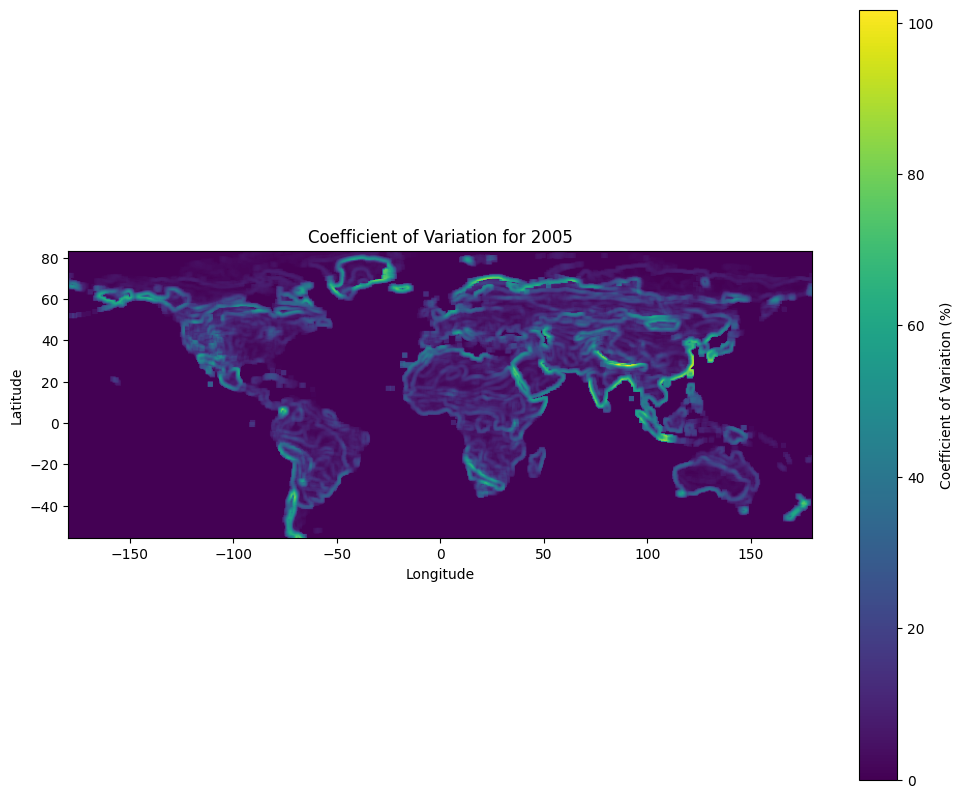

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2006: 0.0, Max: 218.8876495361328
Plotting Coefficient of Variation for the year 2006...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


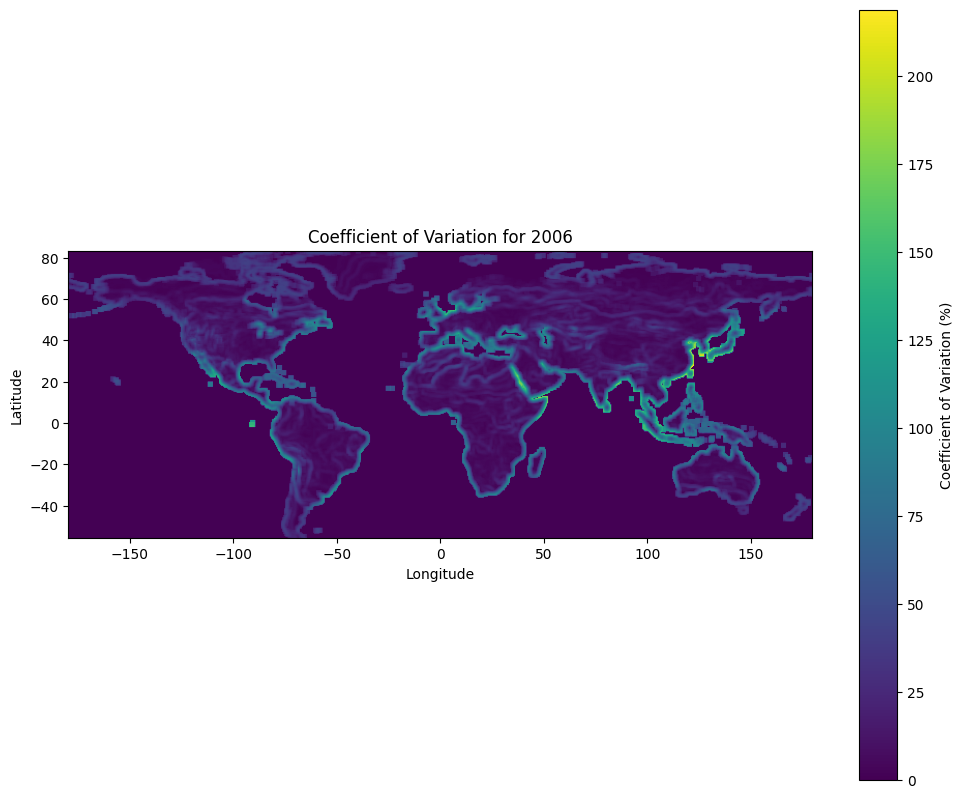

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2007: 0.0, Max: 305.7737121582031
Plotting Coefficient of Variation for the year 2007...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


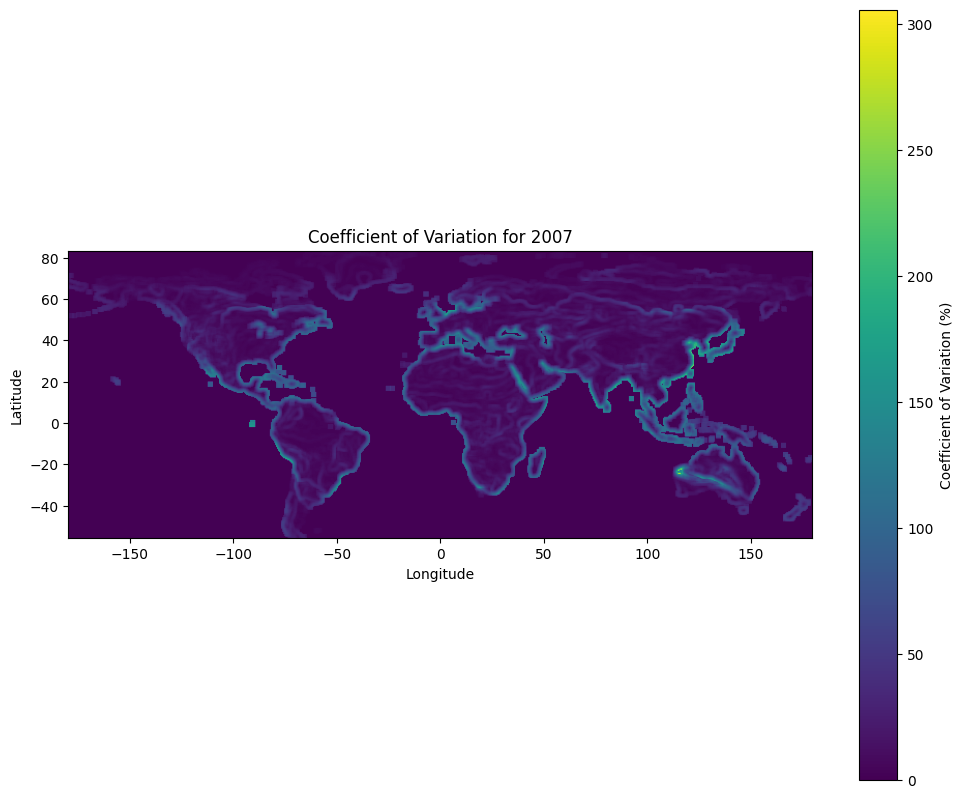

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2008: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2008...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


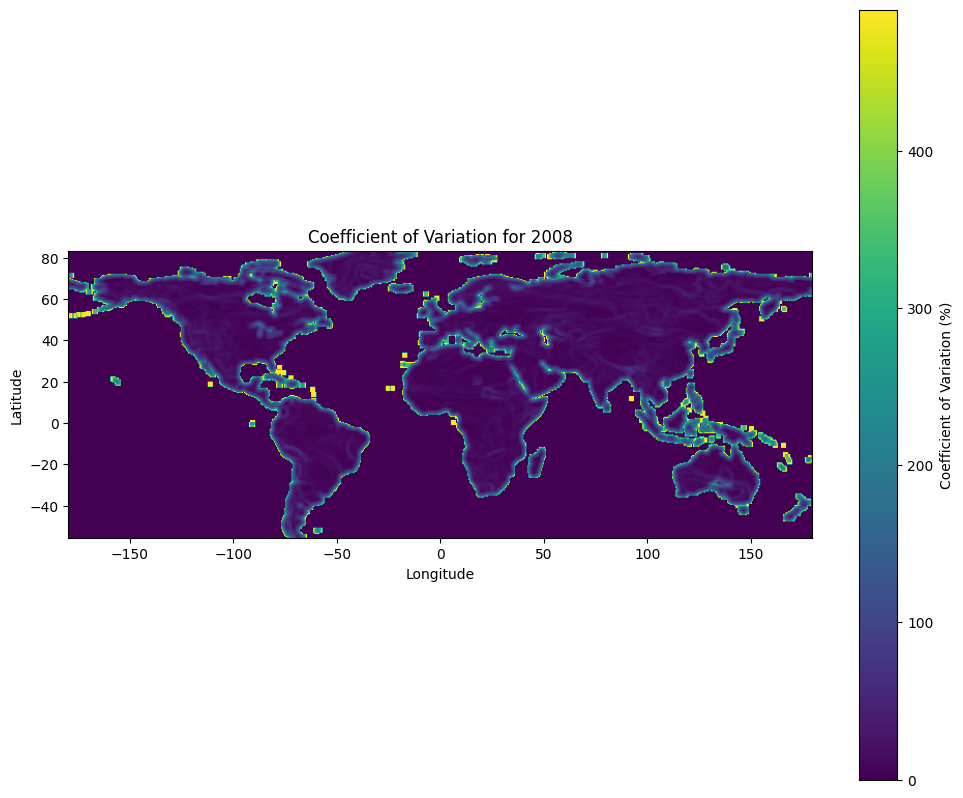

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2009: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2009...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


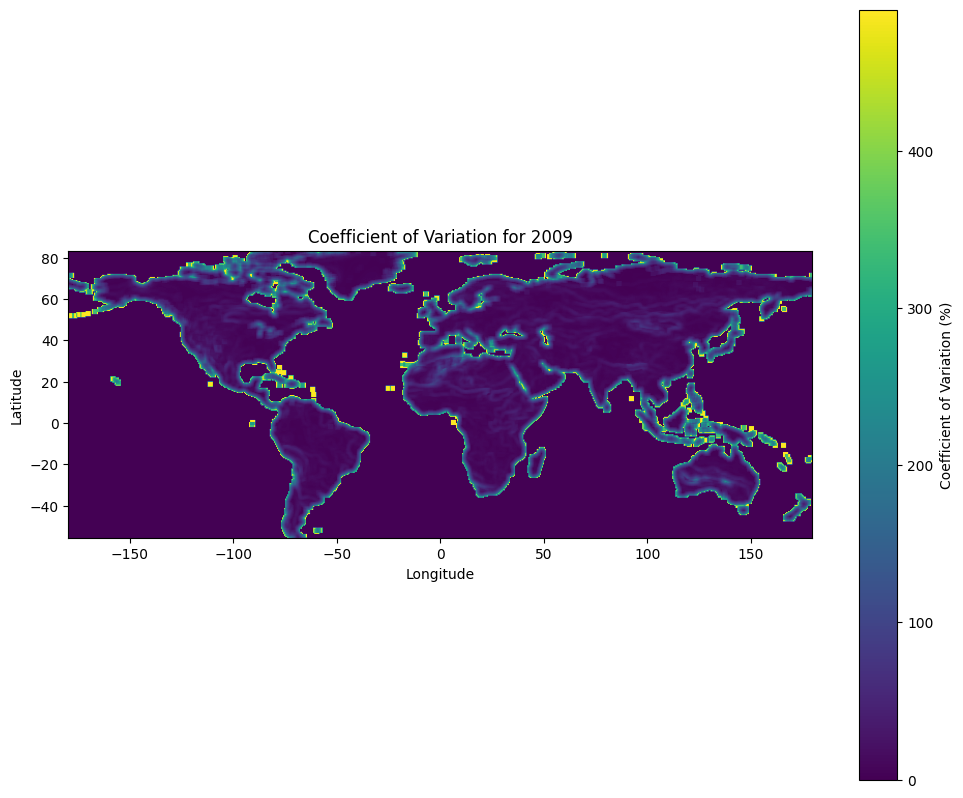

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2010: 0.0, Max: 108.3337631225586
Plotting Coefficient of Variation for the year 2010...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


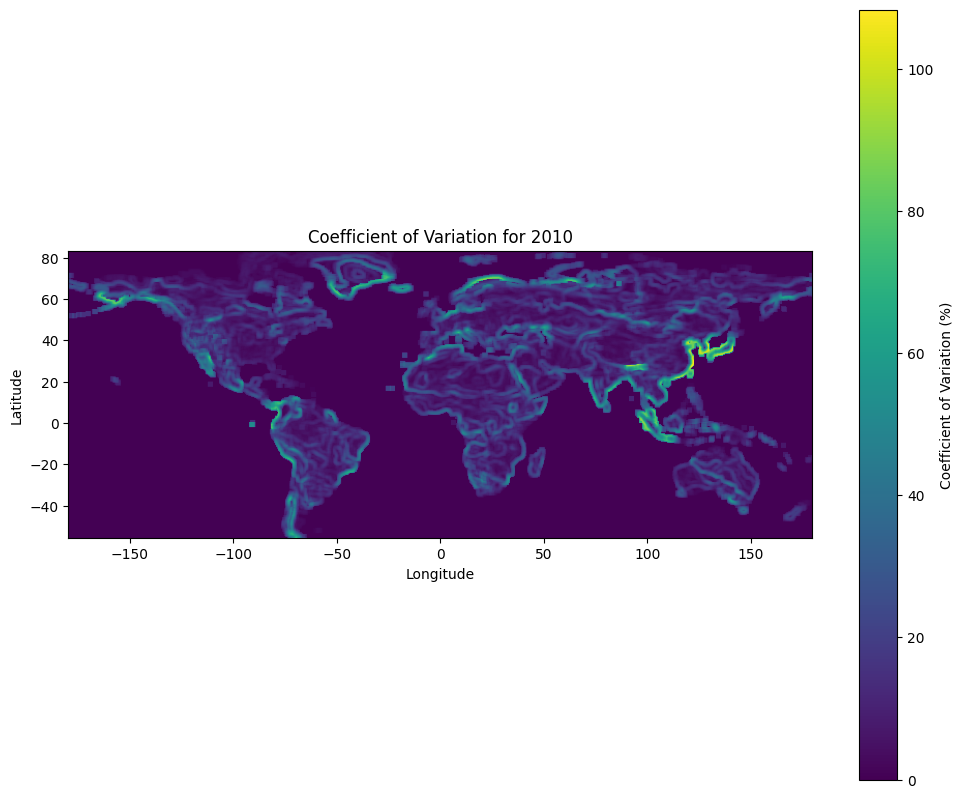

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2011: 0.0, Max: 404.6368408203125
Plotting Coefficient of Variation for the year 2011...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


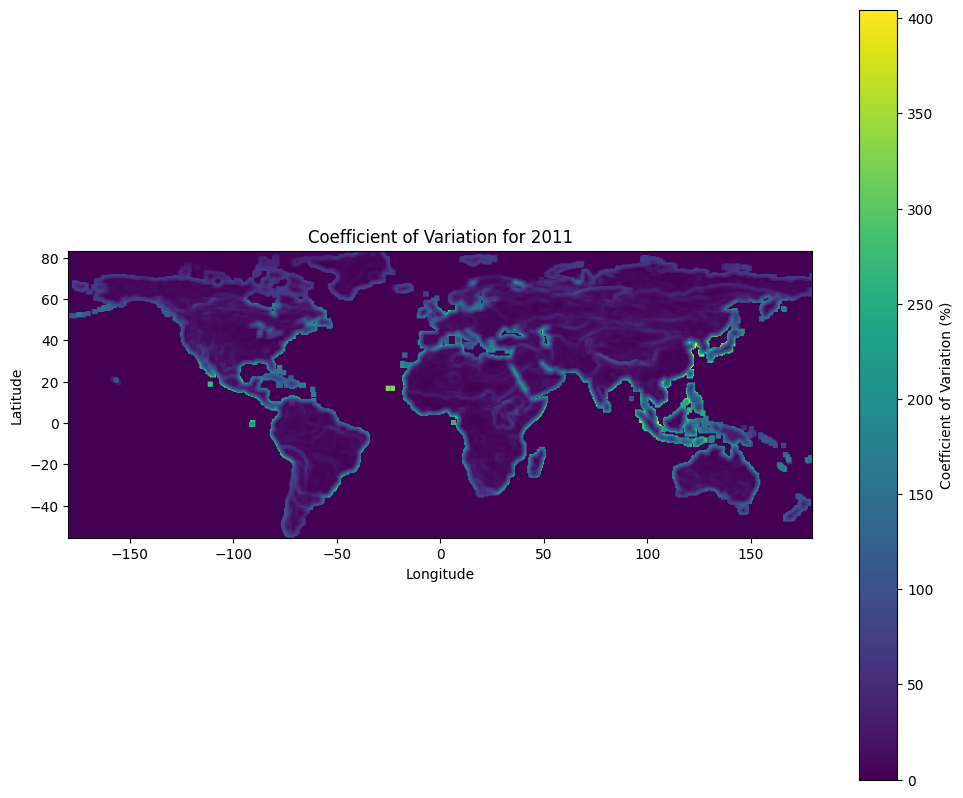

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2012: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2012...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


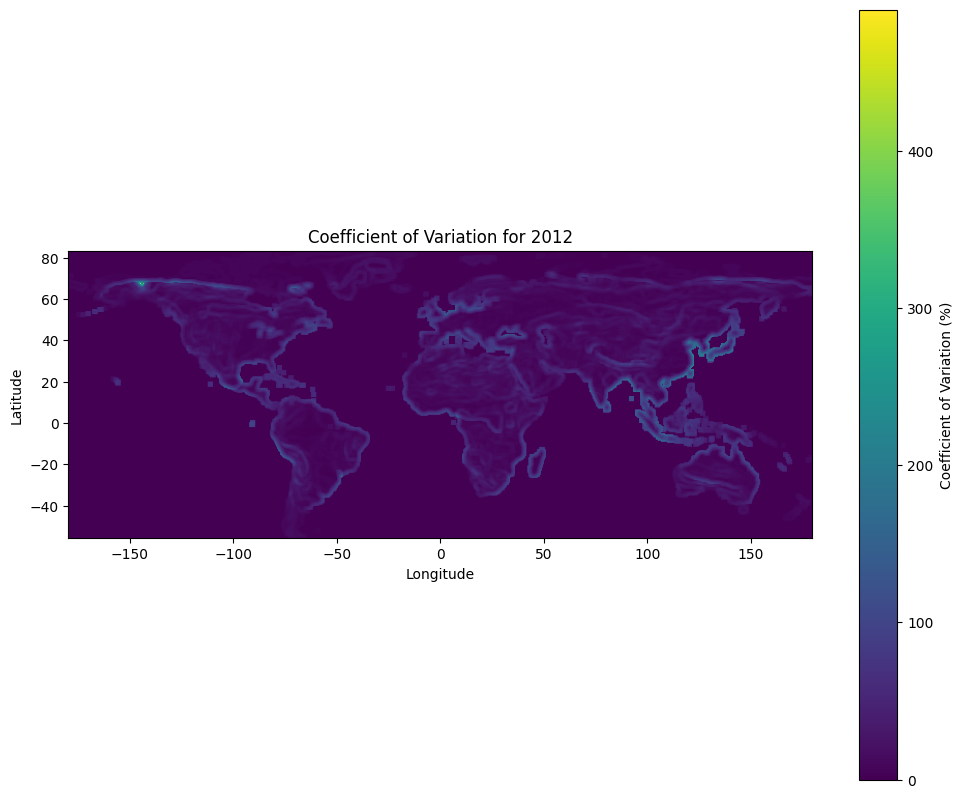

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2013: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2013...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


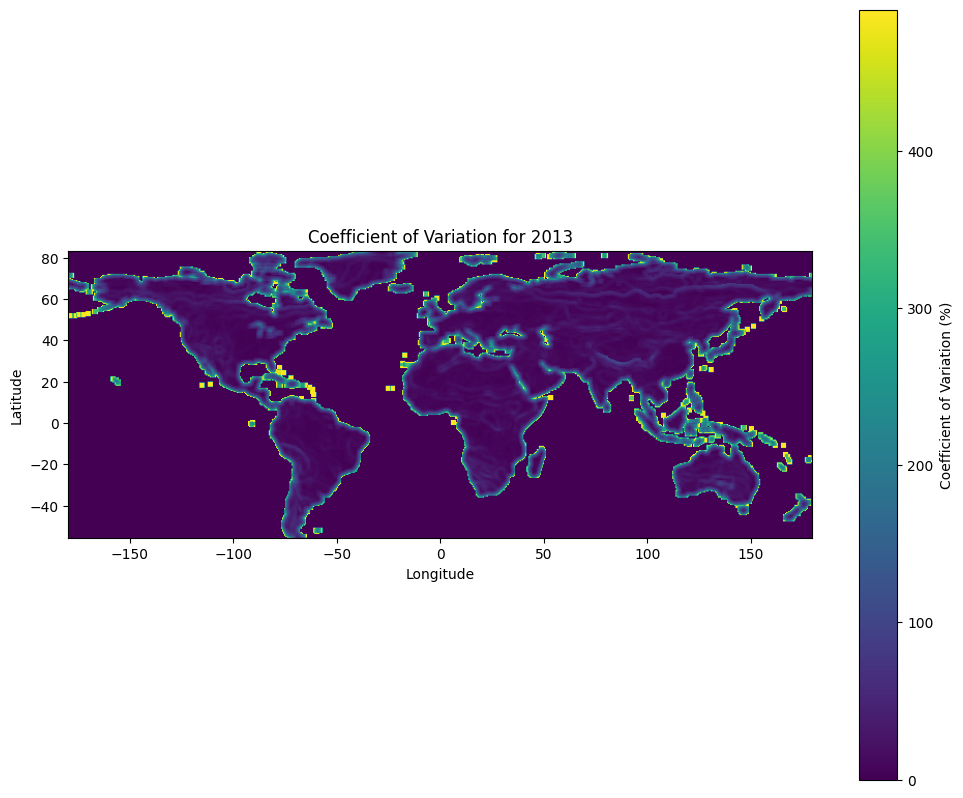

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2014: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2014...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


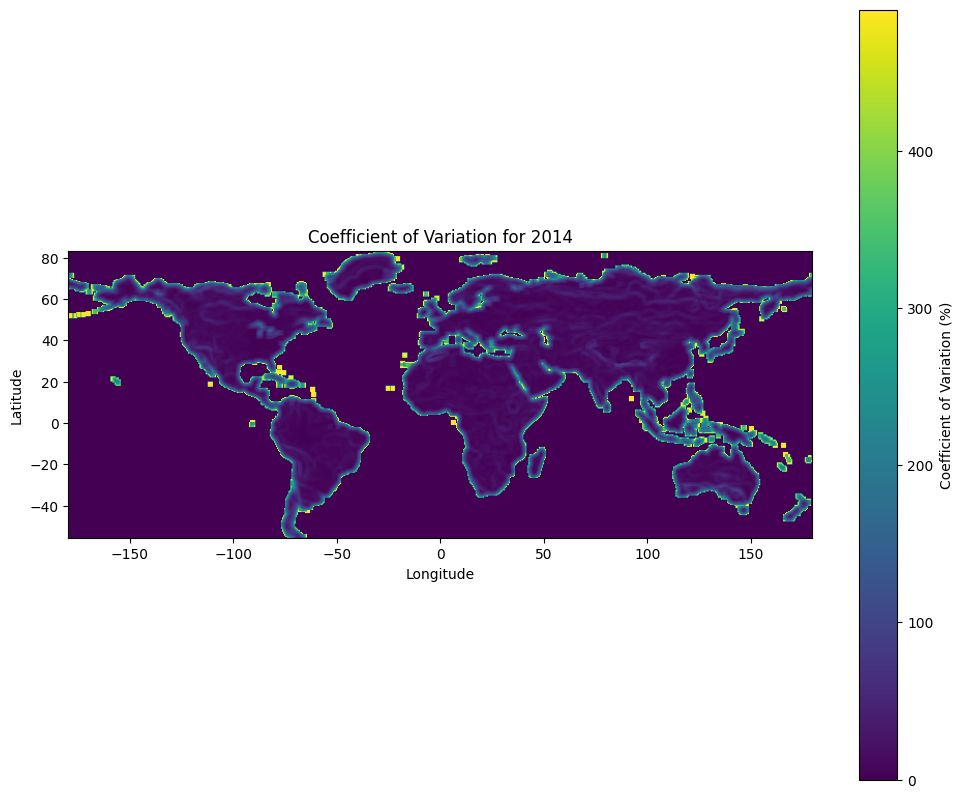

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2015: 0.0, Max: 299.7662353515625
Plotting Coefficient of Variation for the year 2015...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


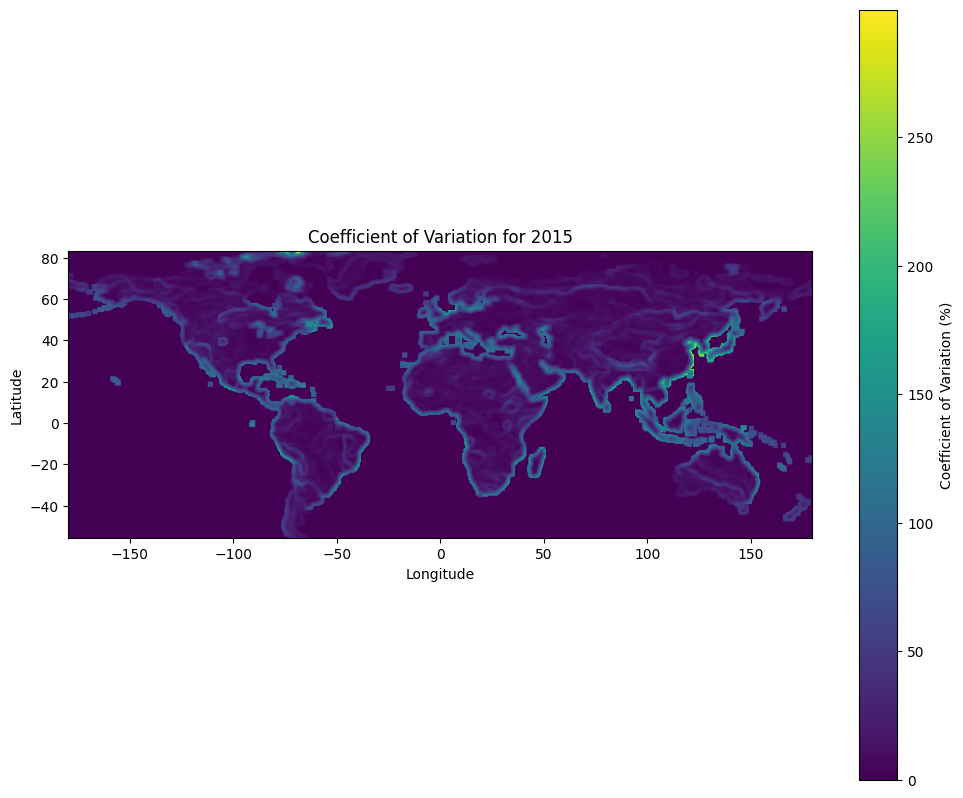

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2016: 0.0, Max: 253.68360900878906
Plotting Coefficient of Variation for the year 2016...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


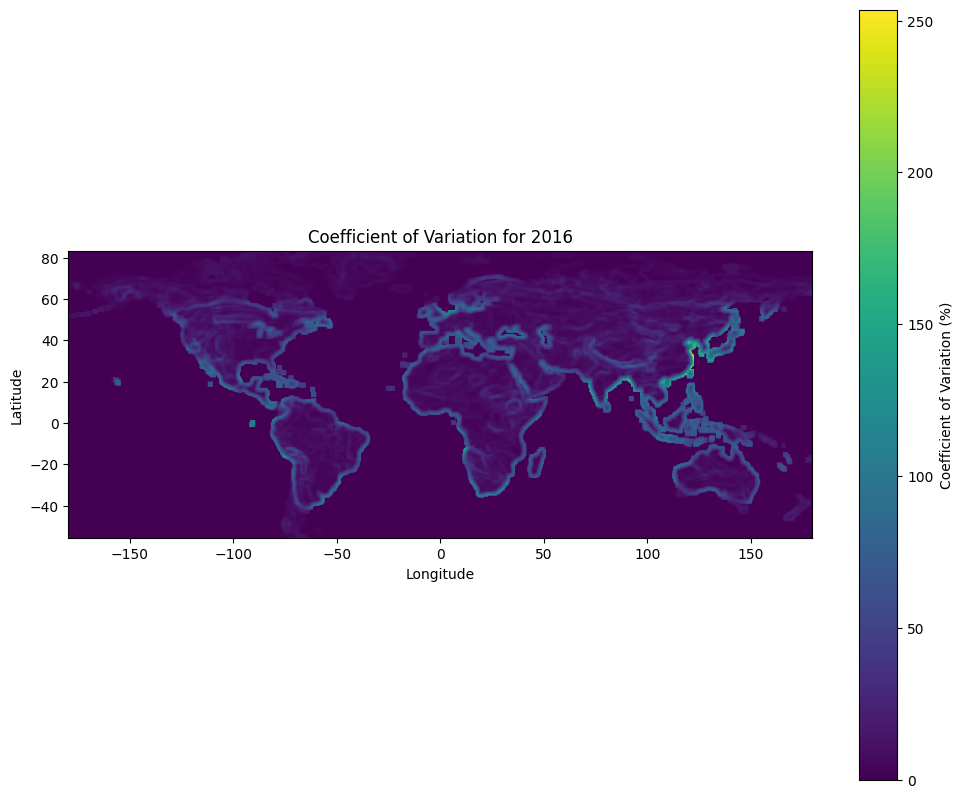

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2017: 0.0, Max: 489.89794921875
Plotting Coefficient of Variation for the year 2017...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


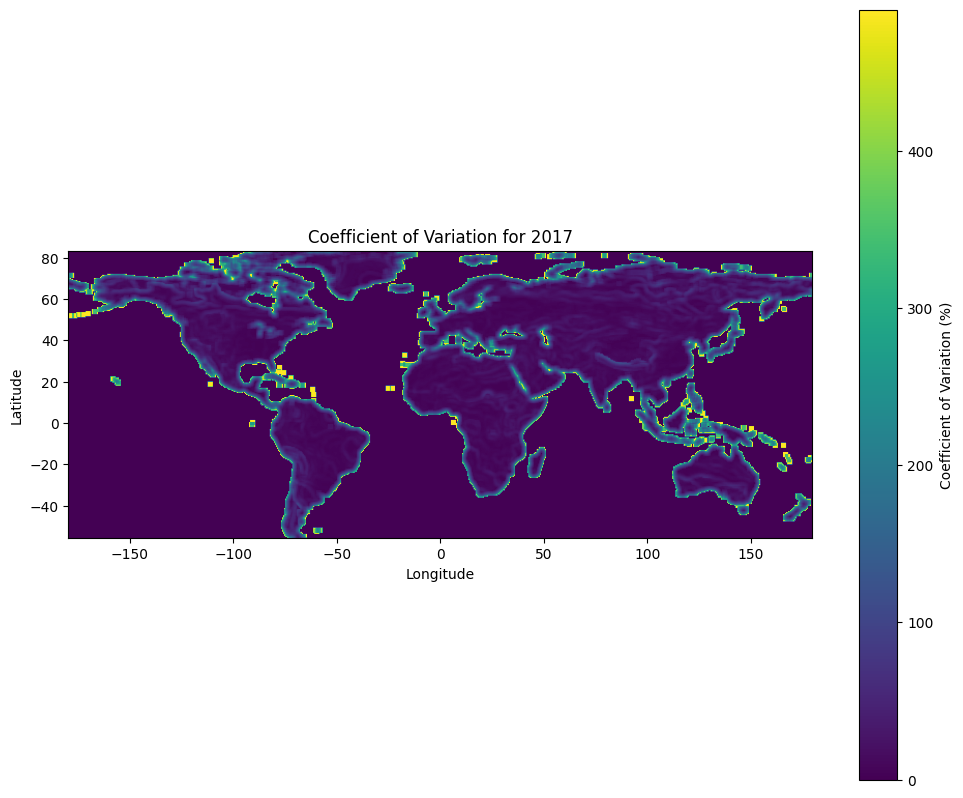

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2018: 0.0, Max: 373.2127380371094
Plotting Coefficient of Variation for the year 2018...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


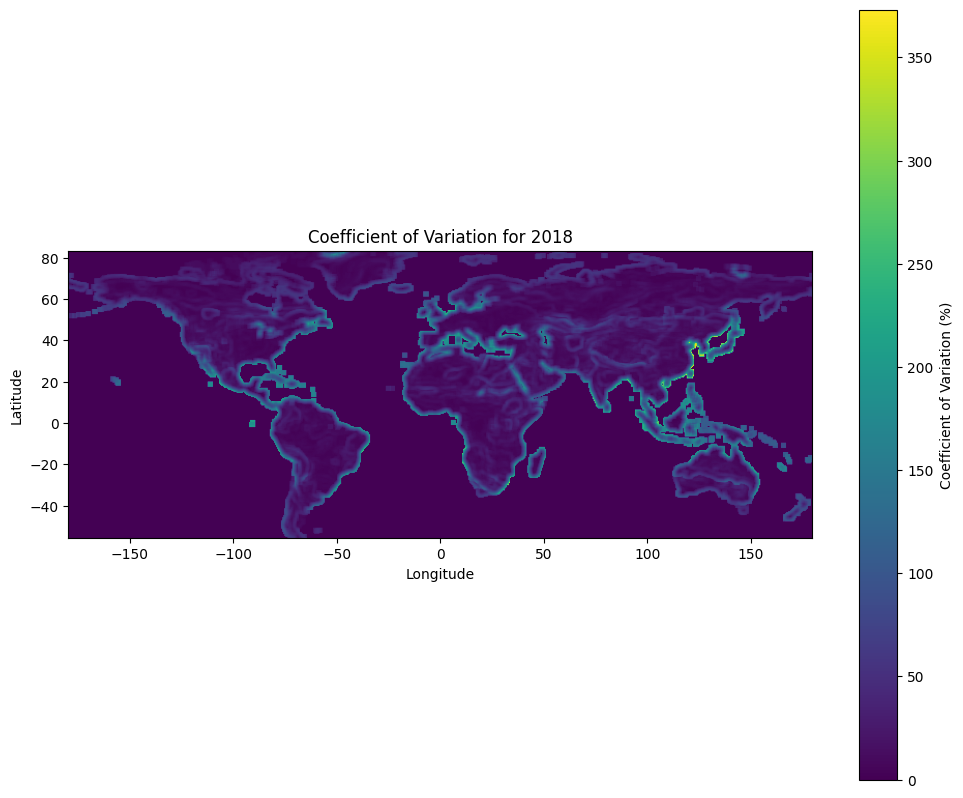

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2019: 0.0, Max: 283.2554931640625
Plotting Coefficient of Variation for the year 2019...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


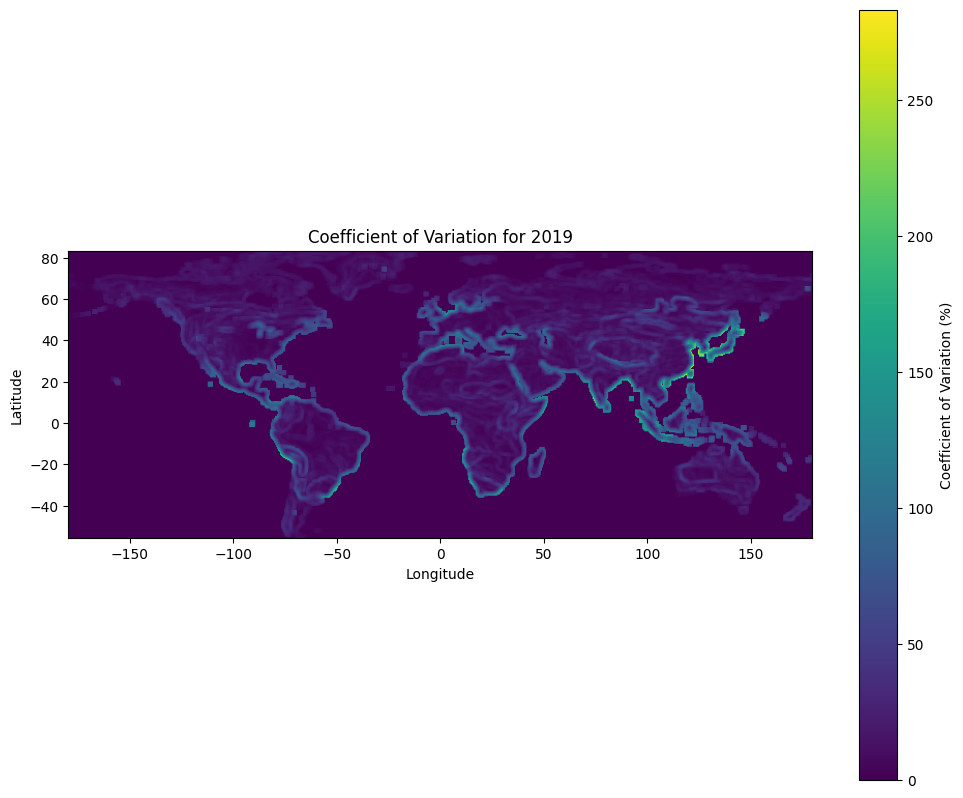

Shape of year_data: (277, 719)
Shape of cv_year: (277, 719)
CV Data Min for 2020: 0.0, Max: 141.26185607910156
Plotting Coefficient of Variation for the year 2020...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


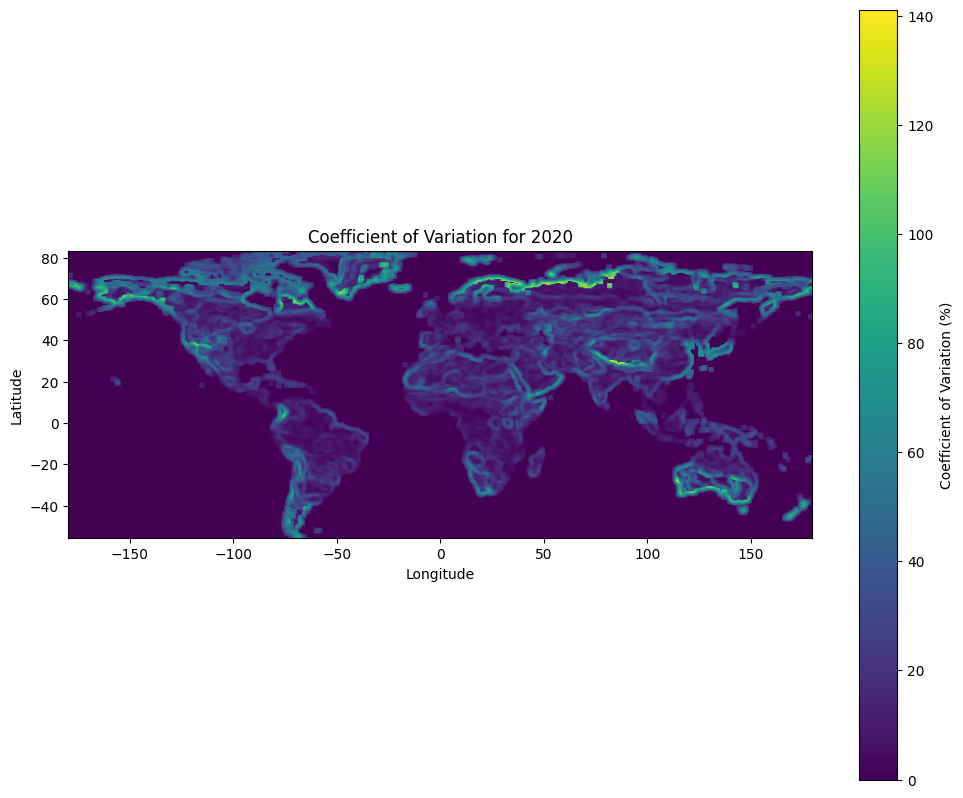

CV Data Min for 2005-2020: 5.791835308074951, Max: 243.3269500732422
Plotting Coefficient of Variation for 2005-2020...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


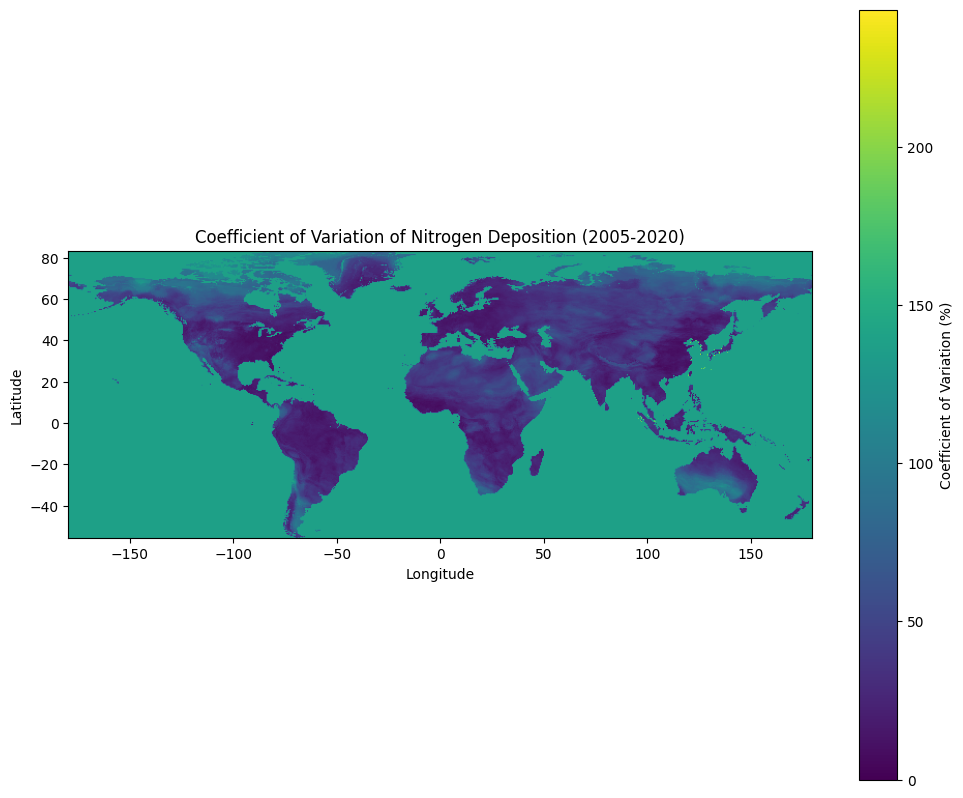

In [42]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from affine import Affine
import os
from scipy.ndimage import generic_filter

def load_multiband_raster(file_path):
    with rasterio.open(file_path) as src:
        bands = [src.read(i + 1) for i in range(src.count)]
        meta = src.meta
    return np.array(bands), meta

def clean_raster_data(raster_data):
    cleaned_data = np.copy(raster_data)
    cleaned_data[np.isnan(cleaned_data) | (cleaned_data < 0)] = 0
    return cleaned_data

def calculate_local_cv(values):
    if np.all(values == 0):
        return 0
    mean = np.mean(values)
    if mean == 0:
        return 0
    std_dev = np.std(values)
    return (std_dev / mean) * 100

def calculate_pixelwise_cv(data, window_size=5):
    if data.ndim == 2:
        return generic_filter(data, calculate_local_cv, size=window_size)
    elif data.ndim == 3:
        mean = np.mean(data, axis=0)
        std_dev = np.std(data, axis=0)
        cv = np.zeros_like(mean)
        non_zero = mean != 0
        cv[non_zero] = (std_dev[non_zero] / mean[non_zero]) * 100
        return cv
    else:
        print(f"Unexpected data shape: {data.shape}")
        return np.array([])

def plot_raster(data, transform, title):
    fig, ax = plt.subplots(figsize=(12, 10))
    
    transform = Affine(*transform)
    
    height, width = data.shape
    lon_min, lat_max = transform * (0, 0)
    lon_max, lat_min = transform * (width, height)
    
    extent = (lon_min, lon_max, lat_min, lat_max)
    
    print(f"Transform: {transform}")
    print(f"Width: {width}, Height: {height}")
    print(f"Extent: {extent}")
    
    cax = ax.imshow(data, cmap='viridis', norm=Normalize(vmin=0, vmax=np.max(data)), 
                    origin='upper', extent=extent)
    cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
    cbar.set_label('Coefficient of Variation (%)')
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

def save_raster(data, transform, meta, file_path):
    meta.update({
        'driver': 'GTiff',
        'count': 1,
        'dtype': data.dtype,
        'height': data.shape[0],
        'width': data.shape[1],
        'crs': meta['crs'],
        'transform': transform
    })
    with rasterio.open(file_path, 'w', **meta) as dst:
        dst.write(data, 1)

composite_file = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Land_Composite_Pred_2005_2020.tif"
output_folder = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Coefficient_of_Variation"

os.makedirs(output_folder, exist_ok=True)

composite_data, meta = load_multiband_raster(composite_file)
transform = meta['transform']

print(f"Shape of composite_data: {composite_data.shape}")
print(f"CRS: {meta['crs']}")

cleaned_data = clean_raster_data(composite_data)
print(f"Shape of cleaned_data: {cleaned_data.shape}")

for year_index in range(cleaned_data.shape[0]):
    year_data = cleaned_data[year_index]
    print(f"Shape of year_data: {year_data.shape}")
    cv_year = calculate_pixelwise_cv(year_data)
    print(f"Shape of cv_year: {cv_year.shape}")
    
    print(f"CV Data Min for {2005 + year_index}: {np.min(cv_year)}, Max: {np.max(cv_year)}")
    
    save_path = os.path.join(output_folder, f"CV_{2005 + year_index}.tif")
    save_raster(cv_year, transform, meta, save_path)
    
    print(f"Plotting Coefficient of Variation for the year {2005 + year_index}...")
    plot_raster(cv_year, transform, f"Coefficient of Variation for {2005 + year_index}")

cv_data_combined = calculate_pixelwise_cv(cleaned_data)

print(f"CV Data Min for 2005-2020: {np.min(cv_data_combined)}, Max: {np.max(cv_data_combined)}")

save_path = os.path.join(output_folder, "CV_2005_2020.tif")
save_raster(cv_data_combined, transform, meta, save_path)

print("Plotting Coefficient of Variation for 2005-2020...")
plot_raster(cv_data_combined, transform, "Coefficient of Variation of Nitrogen Deposition (2005-2020)")

Shape of composite_data: (16, 277, 719)
CRS: EPSG:4326
Shape of cleaned_data: (16, 277, 719)
CV Data Min for 2005: 0.0, Max: 101.7535629272461
95% CI for 2005: (4.796305863456678, 4.817895682258654)
Plotting Coefficient of Variation for the year 2005...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


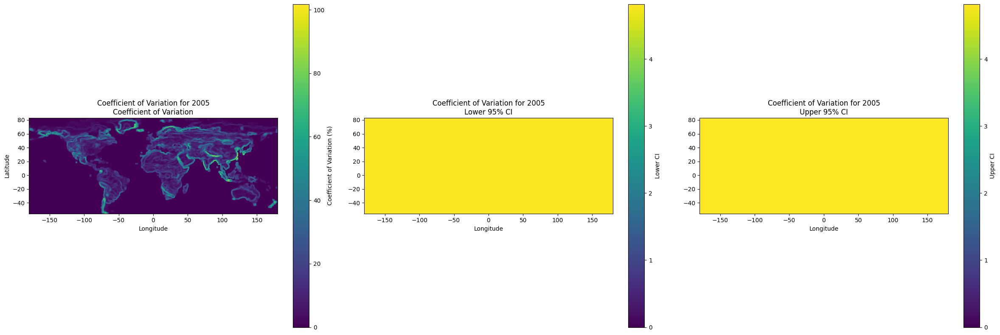

CV Data Min for 2006: 0.0, Max: 218.8876495361328
95% CI for 2006: (2.3058826038944655, 2.3302191188228196)
Plotting Coefficient of Variation for the year 2006...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


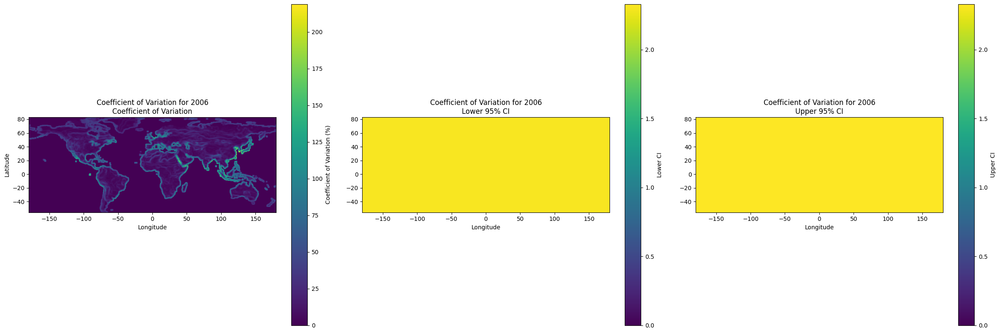

CV Data Min for 2007: 0.0, Max: 305.7737121582031
95% CI for 2007: (1.993055080265268, 2.016808773189322)
Plotting Coefficient of Variation for the year 2007...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


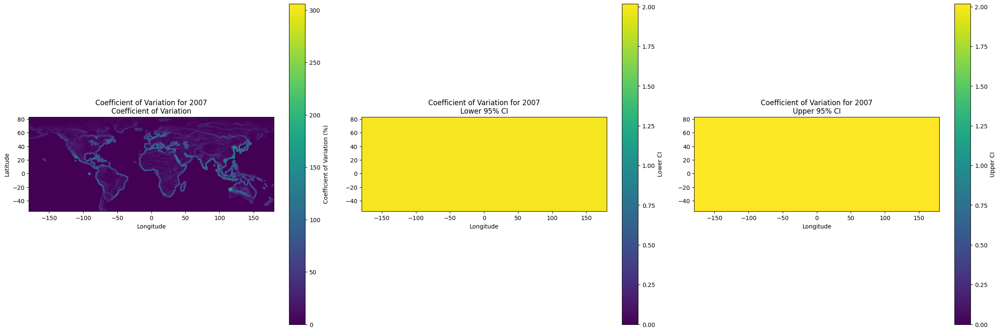

CV Data Min for 2008: 0.0, Max: 489.89794921875
95% CI for 2008: (1.3804391594112726, 1.406000259381452)
Plotting Coefficient of Variation for the year 2008...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


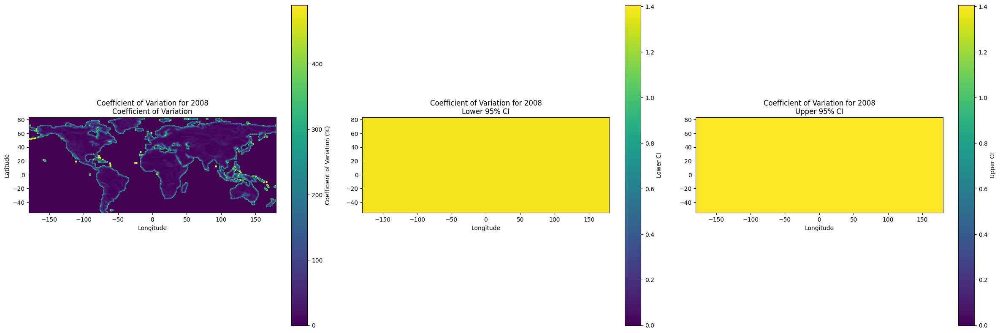

CV Data Min for 2009: 0.0, Max: 489.89794921875
95% CI for 2009: (1.2644644270939887, 1.2887756337122858)
Plotting Coefficient of Variation for the year 2009...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


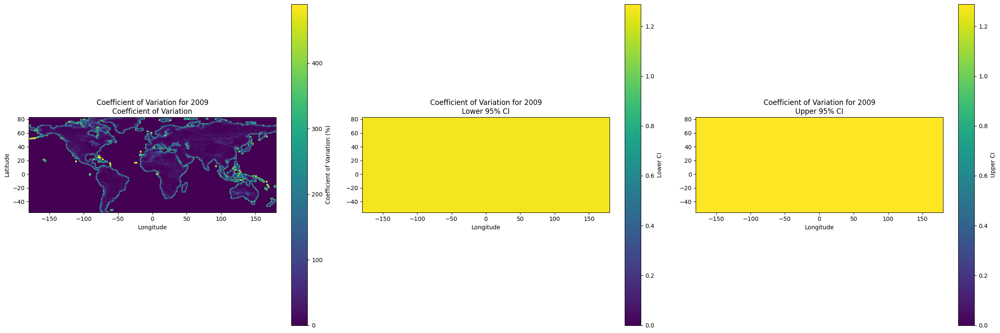

CV Data Min for 2010: 0.0, Max: 108.3337631225586
95% CI for 2010: (3.890332900280229, 3.9091179740483843)
Plotting Coefficient of Variation for the year 2010...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


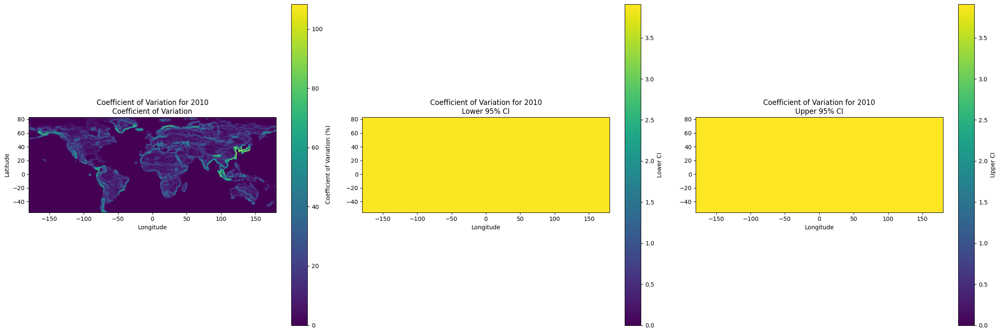

CV Data Min for 2011: 0.0, Max: 404.6368408203125
95% CI for 2011: (1.4144364692039053, 1.4392267368965586)
Plotting Coefficient of Variation for the year 2011...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


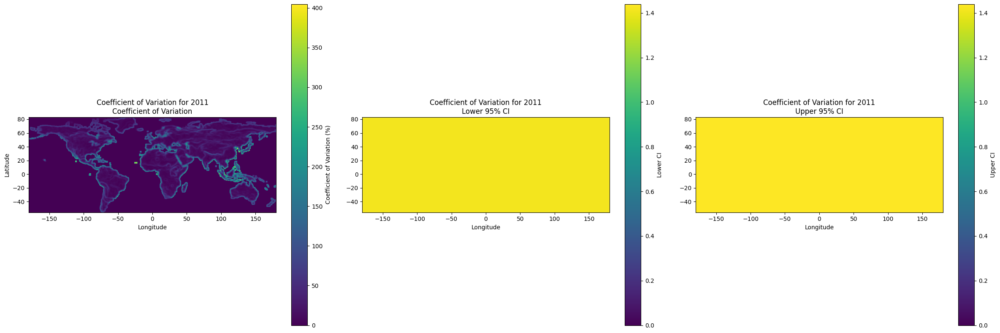

CV Data Min for 2012: 0.0, Max: 489.89794921875
95% CI for 2012: (2.0258480420895233, 2.047516692560135)
Plotting Coefficient of Variation for the year 2012...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


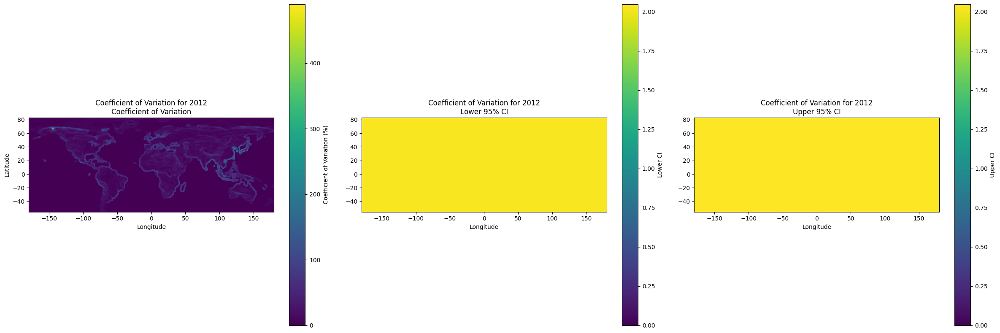

CV Data Min for 2013: 0.0, Max: 489.89794921875
95% CI for 2013: (1.2864991394541492, 1.3119622500874768)
Plotting Coefficient of Variation for the year 2013...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


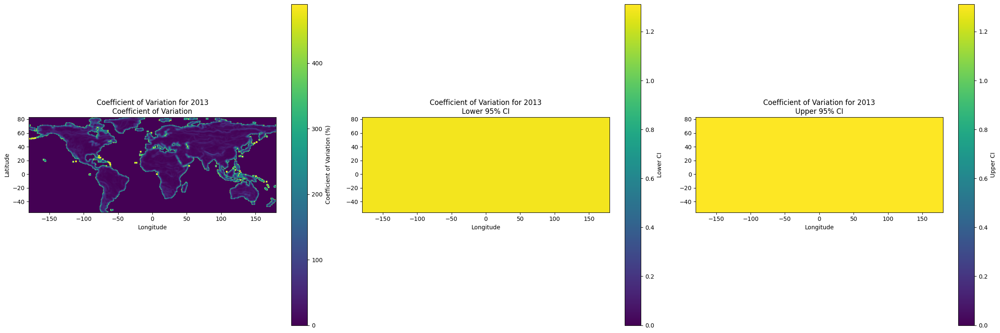

CV Data Min for 2014: 0.0, Max: 489.89794921875
95% CI for 2014: (1.2874131533484447, 1.312573399843694)
Plotting Coefficient of Variation for the year 2014...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


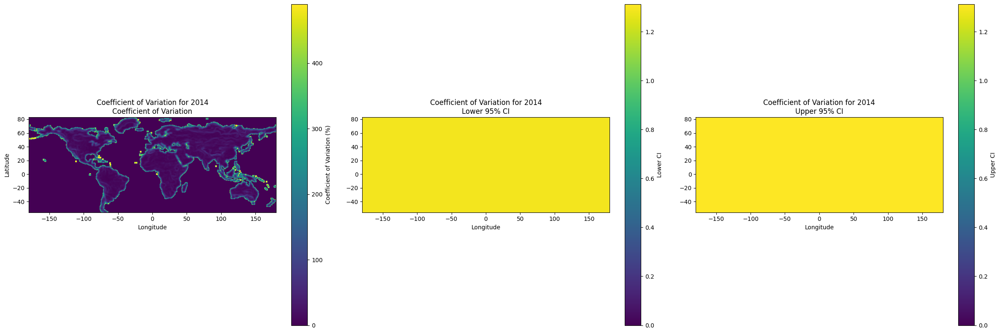

CV Data Min for 2015: 0.0, Max: 299.7662353515625
95% CI for 2015: (1.8085054895683639, 1.8311923005775101)
Plotting Coefficient of Variation for the year 2015...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


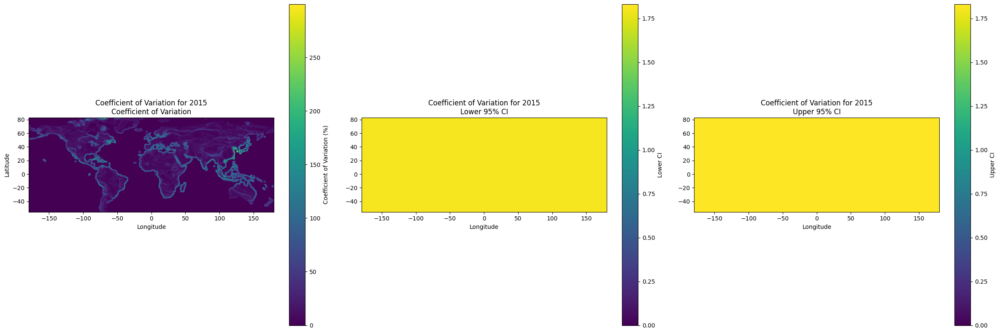

CV Data Min for 2016: 0.0, Max: 253.68360900878906
95% CI for 2016: (2.3415181329890706, 2.3647597143009684)
Plotting Coefficient of Variation for the year 2016...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


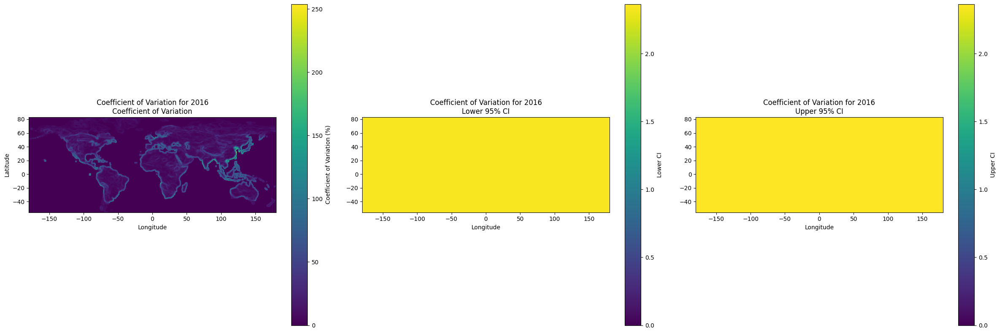

CV Data Min for 2017: 0.0, Max: 489.89794921875
95% CI for 2017: (1.2699801003764275, 1.294626566188514)
Plotting Coefficient of Variation for the year 2017...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


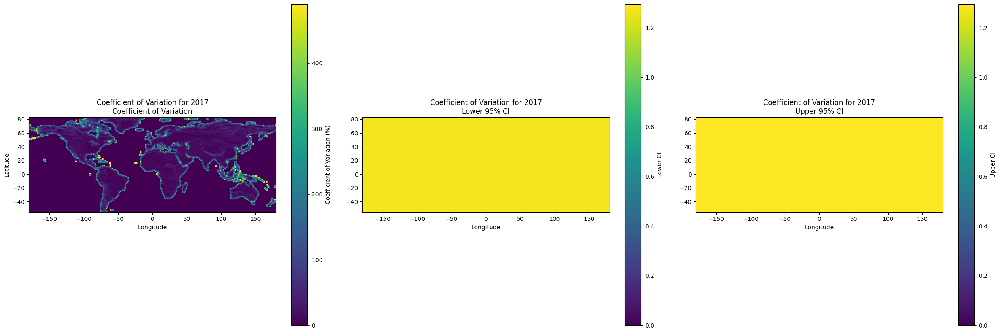

CV Data Min for 2018: 0.0, Max: 373.2127380371094
95% CI for 2018: (1.3761984244681769, 1.3995522125862665)
Plotting Coefficient of Variation for the year 2018...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


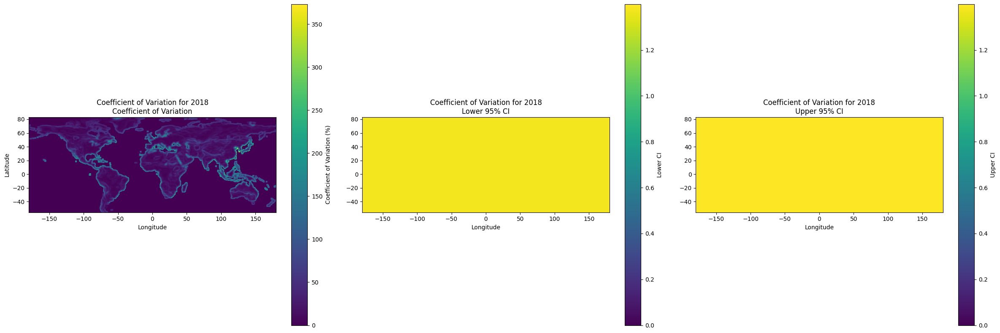

CV Data Min for 2019: 0.0, Max: 283.2554931640625
95% CI for 2019: (1.8531535245040338, 1.8760179900070746)
Plotting Coefficient of Variation for the year 2019...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


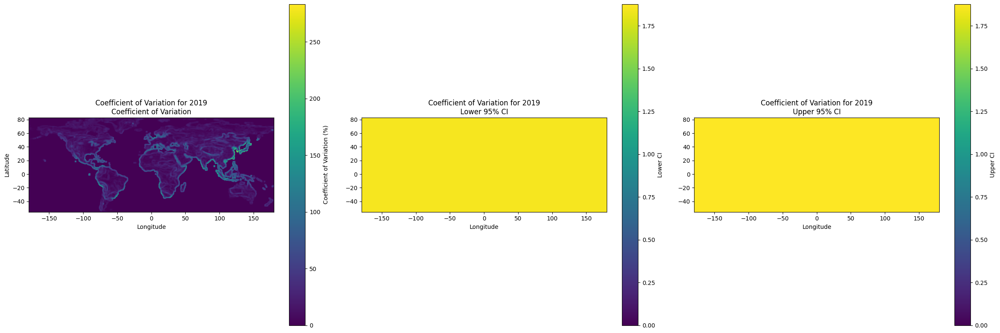

CV Data Min for 2020: 0.0, Max: 141.26185607910156
95% CI for 2020: (5.571196176475315, 5.591114423805447)
Plotting Coefficient of Variation for the year 2020...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


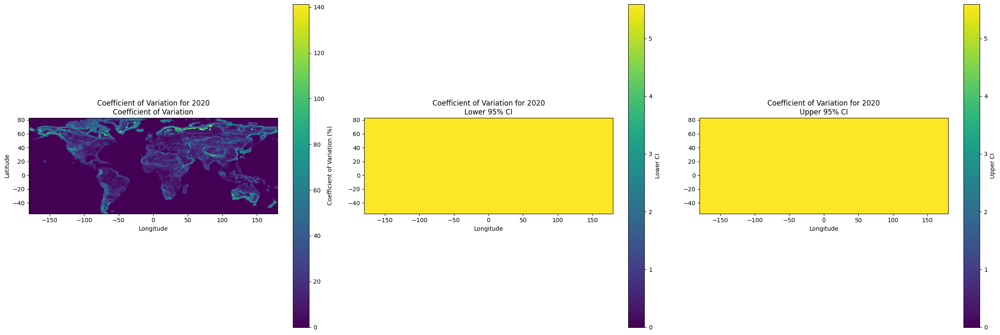

CV Data Min for 2005-2020: 5.791835308074951, Max: 243.3269500732422
95% CI for 2005-2020: (2.24996378397468, 2.256449675803152)
Plotting Coefficient of Variation for 2005-2020...
Transform: | 0.50, 0.00,-179.69|
| 0.00,-0.50, 83.05|
| 0.00, 0.00, 1.00|
Width: 719, Height: 277
Extent: (-179.6875, 179.8125, -55.44552993774417, 83.05447006225583)


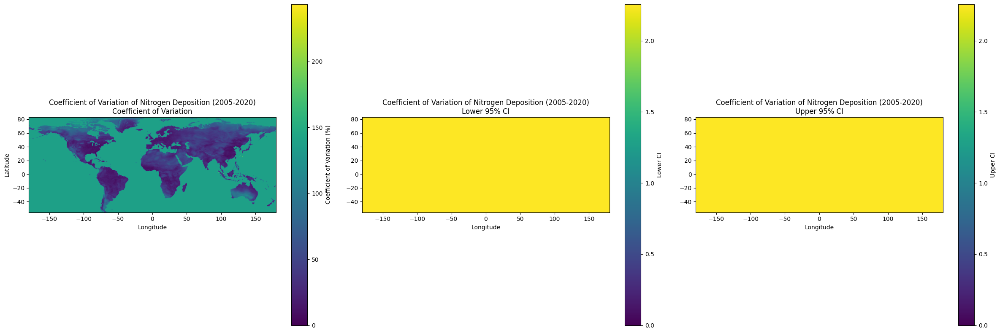

In [47]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from affine import Affine
import os
from scipy.ndimage import generic_filter
from scipy import stats

def load_multiband_raster(file_path):
    with rasterio.open(file_path) as src:
        bands = [src.read(i + 1) for i in range(src.count)]
        meta = src.meta
    return np.array(bands), meta

def clean_raster_data(raster_data):
    cleaned_data = np.copy(raster_data)
    cleaned_data[np.isnan(cleaned_data) | (cleaned_data < 0)] = 0
    return cleaned_data

def calculate_local_cv(values):
    if np.all(values == 0):
        return 0
    mean = np.mean(values)
    if mean == 0:
        return 0
    std_dev = np.std(values)
    return (std_dev / mean) * 100

def calculate_pixelwise_cv(data, window_size=5):
    if data.ndim == 2:
        return generic_filter(data, calculate_local_cv, size=window_size)
    elif data.ndim == 3:
        mean = np.mean(data, axis=0)
        std_dev = np.std(data, axis=0)
        cv = np.zeros_like(mean)
        non_zero = mean != 0
        cv[non_zero] = (std_dev[non_zero] / mean[non_zero]) * 100
        return cv
    else:
        print(f"Unexpected data shape: {data.shape}")
        return np.array([])

def calculate_ci(data, confidence=0.95):
    mean = np.mean(data)
    std_error = stats.sem(data)
    ci = stats.t.interval(confidence, len(data)-1, loc=mean, scale=std_error)
    return ci

def plot_raster_with_ci(data, ci, transform, title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    
    transform = Affine(*transform)
    
    height, width = data.shape
    lon_min, lat_max = transform * (0, 0)
    lon_max, lat_min = transform * (width, height)
    
    extent = (lon_min, lon_max, lat_min, lat_max)
    
    print(f"Transform: {transform}")
    print(f"Width: {width}, Height: {height}")
    print(f"Extent: {extent}")
    
    # Ensure data is 2D
    if data.ndim == 1:
        data = data.reshape((height, width))
    
    # Plot CV
    cax1 = ax1.imshow(data, cmap='viridis', norm=Normalize(vmin=0, vmax=np.max(data)), 
                      origin='upper', extent=extent)
    plt.colorbar(cax1, ax=ax1, orientation='vertical', label='Coefficient of Variation (%)')
    ax1.set_title(f"{title}\nCoefficient of Variation")
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    
    # Plot CI
    # Note: CI is scalar and not per pixel, hence no reshaping required
    ci_lower = np.full((height, width), ci[0])
    ci_upper = np.full((height, width), ci[1])
    
    cax2 = ax2.imshow(ci_lower, cmap='viridis', norm=Normalize(vmin=0, vmax=np.max(ci_upper)), 
                      origin='upper', extent=extent)
    plt.colorbar(cax2, ax=ax2, orientation='vertical', label='Lower CI')
    ax2.set_title(f"{title}\nLower 95% CI")
    ax2.set_xlabel('Longitude')
    
    cax3 = ax3.imshow(ci_upper, cmap='viridis', norm=Normalize(vmin=0, vmax=np.max(ci_upper)), 
                      origin='upper', extent=extent)
    plt.colorbar(cax3, ax=ax3, orientation='vertical', label='Upper CI')
    ax3.set_title(f"{title}\nUpper 95% CI")
    ax3.set_xlabel('Longitude')
    
    plt.tight_layout()
    plt.show()

def save_raster(data, transform, meta, file_path):
    meta.update({
        'driver': 'GTiff',
        'count': 1,
        'dtype': data.dtype,
        'height': data.shape[0],
        'width': data.shape[1],
        'crs': meta['crs'],
        'transform': transform
    })
    with rasterio.open(file_path, 'w', **meta) as dst:
        dst.write(data, 1)

composite_file = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Land_Composite_Pred_2005_2020.tif"
output_folder = "F:\\PhD Work\\NOx_NH3_Conference\\Global N deposition_1\\Prediction_4.0\\Coefficient_of_Variation"

os.makedirs(output_folder, exist_ok=True)

composite_data, meta = load_multiband_raster(composite_file)
transform = meta['transform']

print(f"Shape of composite_data: {composite_data.shape}")
print(f"CRS: {meta['crs']}")

cleaned_data = clean_raster_data(composite_data)
print(f"Shape of cleaned_data: {cleaned_data.shape}")

for year_index in range(cleaned_data.shape[0]):
    year_data = cleaned_data[year_index]
    
    # Clean data for the specific year
    year_data_cleaned = clean_raster_data(year_data)
    
    cv_year = calculate_pixelwise_cv(year_data_cleaned)
    ci_year = calculate_ci(year_data_cleaned.flatten())
    
    print(f"CV Data Min for {2005 + year_index}: {np.min(cv_year)}, Max: {np.max(cv_year)}")
    print(f"95% CI for {2005 + year_index}: {ci_year}")
    
    save_path = os.path.join(output_folder, f"CV_{2005 + year_index}.tif")
    save_raster(cv_year, transform, meta, save_path)
    
    print(f"Plotting Coefficient of Variation for the year {2005 + year_index}...")
    plot_raster_with_ci(cv_year, ci_year, transform, f"Coefficient of Variation for {2005 + year_index}")

cv_data_combined = calculate_pixelwise_cv(cleaned_data)
ci_combined = calculate_ci(cleaned_data.flatten())

print(f"CV Data Min for 2005-2020: {np.min(cv_data_combined)}, Max: {np.max(cv_data_combined)}")
print(f"95% CI for 2005-2020: {ci_combined}")

save_path = os.path.join(output_folder, "CV_2005_2020.tif")
save_raster(cv_data_combined, transform, meta, save_path)

print("Plotting Coefficient of Variation for 2005-2020...")
plot_raster_with_ci(cv_data_combined, ci_combined, transform, "Coefficient of Variation of Nitrogen Deposition (2005-2020)")
